In [1]:

import os
import json
import glob
import copy
import numpy as np
import pylab as pl
import seaborn as sns
import pandas as pd


from scipy import stats as spstats

from pipeline.python.classifications import experiment_classes as util
from pipeline.python.utils import natural_keys, label_figure

/home/julianarhee/Repositories/2p-pipeline/pipeline/python/classifications/experiment_classes.py:18: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
   

In [2]:
%matplotlib notebook

In [3]:

import scipy.stats as spstats
from sklearn.model_selection import KFold
from sklearn.svm import LinearSVC
from sklearn import preprocessing
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit


# Set responsivity params

In [4]:
# responsive_test = 'nstds'
# responsive_thr = 10.0
# n_stds = 2.5

responsive_test = 'ROC'
responsive_thr = 0.05
n_stds = 0


# Get aggregated data

In [5]:
from pipeline.python.classifications import get_dataset_stats as gd
import cPickle as pkl

options = ['-t', 'traces001']
optsE = gd.extract_options(options)

rootdir = optsE.rootdir
aggregate_dir = optsE.aggregate_dir
fov_type = optsE.fov_type
traceid = optsE.traceid
trace_type = optsE.trace_type
response_type = 'dff'
print aggregate_dir

/n/coxfs01/julianarhee/aggregate-visual-areas


/home/julianarhee/Repositories/2p-pipeline/pipeline/python/classifications/get_dataset_stats.py:17: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to u'nbAgg' by the following code:
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/juliana

In [6]:
sdata_fpath = os.path.join(aggregate_dir, 'dataset_info.pkl')
if os.path.exists(sdata_fpath):
    with open(sdata_fpath, 'rb') as f:
        sdata = pkl.load(f)
else:
    sdata = gd.aggregate_session_info(traceid=optsE.traceid, trace_type=optsE.trace_type, 
                                       state=optsE.state, fov_type=optsE.fov_type, 
                                       visual_areas=optsE.visual_areas,
                                       blacklist=optsE.blacklist, 
                                       rootdir=optsE.rootdir)
    with open(sdata_fpath, 'wb') as f:
        pkl.dump(sdata, f, protocol=pkl.HIGHEST_PROTOCOL)


In [7]:
stats_desc = util.get_stats_desc(traceid=optsE.traceid,
                                      trace_type= optsE.trace_type,
                                      response_type = response_type,
                                      responsive_test = responsive_test,
                                      responsive_thr = responsive_thr,
                                      n_stds = n_stds)
print(stats_desc)

stats-traces001-corrected-dff-ROC-thr-0.05


In [8]:
dsets = sdata[sdata['experiment']=='blobs']

# Create output dir for classification

In [9]:
outdir = os.path.join(aggregate_dir, 'blob-classification', stats_desc)
if not os.path.exists(outdir):
    os.makedirs(outdir)
print(outdir)

/n/coxfs01/julianarhee/aggregate-visual-areas/blob-classification/stats-traces001-corrected-dff-ROC-thr-0.05


In [10]:
def reformat_morph_values(sdf):
    control_ixs = sdf[sdf['morphlevel']==-1].index.tolist()
    sizevals = np.array([round(s, 1) for s in sdf['size'].unique() if s not in ['None', None] and not np.isnan(s)] )
    sdf.loc[sdf.morphlevel==-1, 'size'] = pd.Series(sizevals, index=control_ixs)
    sdf['size'] = [round(s, 1) for s in sdf['size'].values]

    return sdf


In [11]:
# Set plotting params
threshold_dff = False
min_dff = 0.00
cmap = 'inferno'
n_sz = 5
n_mp = 10

tune_name='morph'

incorrect_nvalues = []


In [12]:
data_dir = os.path.join(aggregate_dir, 'data-stats')
os.listdir(data_dir)

load_data = False
blobsdata_outfile = os.path.join(data_dir, 'blobs_%s-%s_%s-thr-%.2f.pkl' % (traceid, response_type, responsive_test, responsive_thr))
print(blobsdata_outfile)
if os.path.exists(blobsdata_outfile):
    print("...loading data")
    with open(blobsdata_outfile, 'rb') as f:
        NEURALDATA = pkl.load(f)
else:
    load_data = True


/n/coxfs01/julianarhee/aggregate-visual-areas/data-stats/blobs_traces001-dff_ROC-thr-0.05.pkl
...loading data


# Test 1 dataset

In [13]:
rootdir = '/n/coxfs01/2p-data'
animalid = 'JC099' #'JC059'
session = '20190609' #'20190227'
visual_area = 'Li'

fov = 'FOV1_zoom2p0x' #'FOV4_zoom4p0x'
traceid = 'traces001' #'traces001'
response_type = 'dff'

fovnum = 1
datakey = '_'.join([session, animalid, 'fov%i' % fovnum])

In [14]:
NEURALDATA[datakey]['data'].shape

(1500, 63)

In [15]:

# data_id = '|'.join([animalid, session, fov, traceid, stats_desc])
# exp = util.Objects(animalid, session, fov, traceid=traceid, rootdir=rootdir)

# # Get stimulus conditions
# sdf = exp.get_stimuli()
# sdf = reformat_morph_values(sdf)
# sizes = np.array(sorted(sdf['size'].unique()))
# morphs = np.array(sorted(sdf['morphlevel'].unique()))

# n_sizes = len(sdf['size'].unique())
# n_morphs = len(sdf['morphlevel'].unique()) 
# #if n_sizes != n_sz or n_morphs != n_mp:
# #    incorrect_nvalues.append(skey)
# #    pass

# # rstats, rlist, _ = util.get_roi_stats(animalid, session, fov, exp_name=exp.name,
# #                              response_type=response_type, responsive_test=responsive_test,
# #                              responsive_thr=responsive_thr, n_stds=n_stds)
# # rstats = rstats['nframes_above']

# # Get metrics for each condition
# estats = exp.get_stats(responsive_test=responsive_test, responsive_thr=responsive_thr, n_stds=n_stds)
# meanr = pd.concat([pd.Series(estats.gdf.get_group(roi).groupby(['config']).mean()['dff'], name=roi) \
#                    for roi in estats.rois], axis=1).T

# # Get ROI list
# if threshold_dff:
#     rois_plot = meanr[(meanr.max(axis=1) > min_dff)].index.tolist()
# else:
#     rois_plot = meanr.index.tolist()

# #stimdf = sdf[sdf['morphlevel'] != -1]

In [41]:
# print("Got %i responsive of %i cells." % (len(rois_plot), estats.nrois))


Got 46 responsive of 190 cells.


In [50]:
# NEURALDATA[datakey]['data'][[rlist[0], 'config']].groupby('config').mean().values

array([[ 2.08925681],
       [ 1.00287019],
       [ 0.36525162],
       [ 0.52192249],
       [ 0.97024893],
       [ 0.13429691],
       [ 0.10021629],
       [ 0.20790045],
       [ 0.26186781],
       [ 0.61221407],
       [ 0.22888961],
       [ 0.12275758],
       [ 0.218355  ],
       [ 0.38321951],
       [ 0.22601979],
       [ 0.54165437],
       [ 0.55099187],
       [ 0.49861819],
       [ 0.20935351],
       [ 0.54962855],
       [ 0.31007546],
       [ 0.16708163],
       [ 0.21964644],
       [ 0.38449893],
       [ 1.96139363],
       [ 0.12850863],
       [ 0.12683121],
       [ 0.14118563],
       [ 0.22807584],
       [ 0.67756874],
       [ 0.42724555],
       [ 0.16044983],
       [ 0.11637058],
       [ 0.1998938 ],
       [ 0.19360297],
       [ 0.45969772],
       [ 0.04607825],
       [ 0.18863097],
       [ 0.34144041],
       [ 0.37257291],
       [ 0.28417915],
       [ 0.2201819 ],
       [ 0.23653478],
       [ 0.30654327],
       [ 1.0153794 ],
       [ 0

<IPython.core.display.Javascript object>


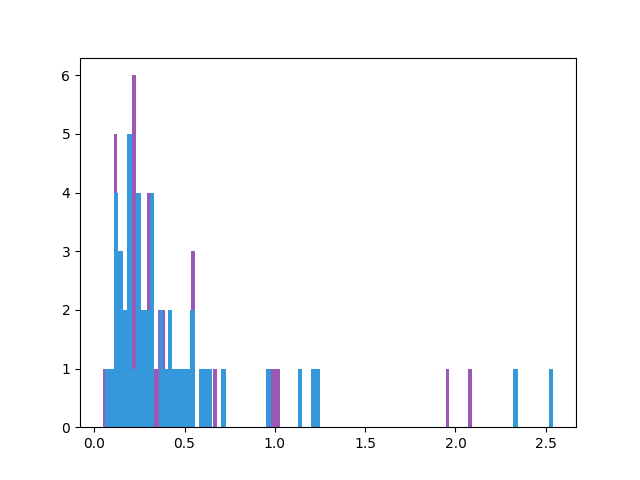

2.08925680842
2.54251637387


In [53]:
#pl.figure()
vs = NEURALDATA[datakey]['data'][[rlist[0], 'config']].groupby('config').mean()[rlist[0]]
pl.figure()
pl.hist(vs, bins=100)
print vs.max()

vs2 = estats.gdf.get_group(rlist[0]).groupby('config').mean()['dff']
pl.hist(vs2, bins=100)
print vs2.max()

<IPython.core.display.Javascript object>


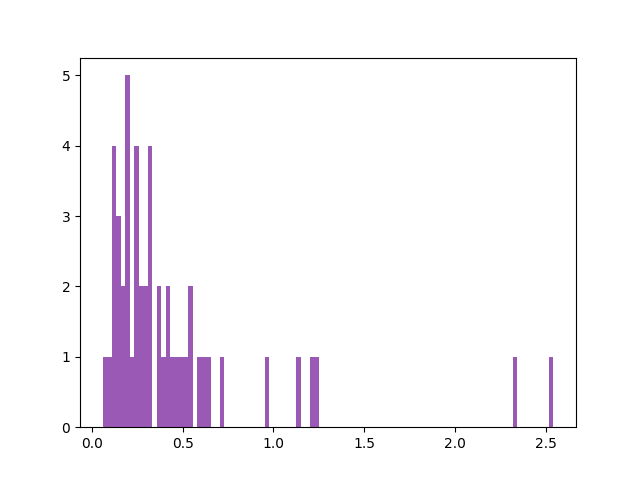

2.54251637387


In [45]:
vs2 = estats.gdf.get_group(rlist[0]).groupby('config').mean()['dff']
pl.hist(vs2, bins=100)
print vs.max()

<IPython.core.display.Javascript object>


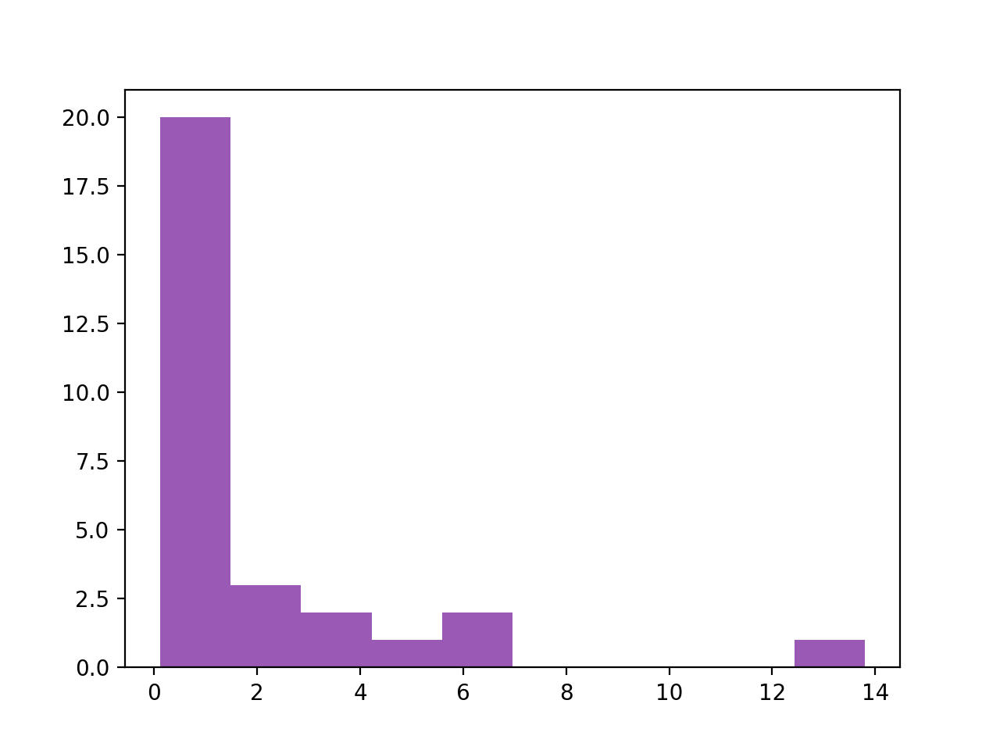

(array([20.,  3.,  2.,  1.,  2.,  0.,  0.,  0.,  0.,  1.]),
 array([ 0.11654463,  1.48462173,  2.85269883,  4.22077593,  5.58885303,
         6.95693013,  8.32500723,  9.69308433, 11.06116143, 12.42923853,
        13.79731563]),
 <a list of 10 Patch objects>)

In [24]:
pl.figure()
pl.hist([g.groupby('config').mean()['dff'].max() for r, g in estats.gdf])

In [56]:

NEURALDATA[datakey]['data'][rlist].shape


(1500, 46)

In [95]:
animalid = 'JC091'
session = '20190607'
fovnum = 1

In [96]:

# sample_data = pd.concat([pd.DataFrame(roidf[response_type].values, columns=[roi],
#                                       index=roidf['config']) for roi, roidf in estats.gdf], axis=1)
# sample_data = sample_data[rois_plot]
#sample_labels = np.array(sample_data.index.tolist())
# sdf = exp.data.sdf.copy()
# sdf = reformat_morph_values(sdf)

datakey = '%s_%s_fov%i' % (session, animalid, fovnum)
data_id = '|'.join([animalid, session, fov, traceid, stats_desc])

roi_list = [r for r in NEURALDATA[datakey]['data'].columns.tolist() if r != 'config']
sample_data = NEURALDATA[datakey]['data'][roi_list].copy()
sample_labels = NEURALDATA[datakey]['data']['config'].copy()
sdf =  NEURALDATA[datakey]['sdf']

#stimdf = sdf[sdf['morphlevel'] != -1]
stimdf = sdf.copy()
tested_sizes = sorted(sdf['size'].unique())
tested_morphs = sorted(sdf['morphlevel'].unique())

#% Specify train/test conditions:     
class_name = 'morphlevel'
class_types = [0, 106]
restrict_transform = True
constant_transform = 'size'

C = 1e3
m0 = 0
m100 = 53 #106

size_colors = sns.cubehelix_palette(len(tested_sizes))
lw=2


<IPython.core.display.Javascript object>


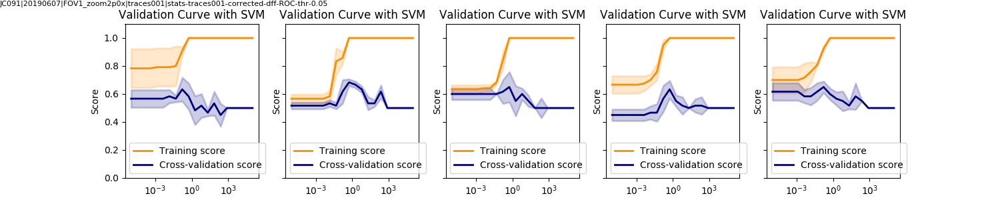

In [97]:
from sklearn.model_selection import validation_curve
from sklearn.svm import SVC


fig, axes = pl.subplots(1, 5, figsize=(15,3), sharex=True,sharey=True)
ai = 0
for curr_sz, curr_color in zip(tested_sizes, size_colors):
    ax = axes[ai]
    # Set train/test set:
    train_configs = stimdf[((stimdf[class_name].isin(class_types))\
                                & (stimdf[constant_transform]==curr_sz))].index.tolist()
    train_ixs = [i for i, l in enumerate(sample_labels) if l in train_configs]

    X = sample_data.iloc[train_ixs].values #[train_configs]
    y = np.array([stimdf[class_name][c] for c in sample_labels.iloc[train_ixs]])


    param_range = np.logspace(-5, 5, 20)
    train_scores, test_scores = validation_curve(
        SVC(), X, y, param_name="gamma", param_range=param_range,
        scoring="accuracy", n_jobs=1)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    ax.set_title("Validation Curve with SVM")
    ax.set_xlabel(r"$\gamma$")
    ax.set_ylabel("Score")
    ax.set_ylim(0.0, 1.1)
    lw = 2
    ax.semilogx(param_range, train_scores_mean, label="Training score",
                 color="darkorange", lw=lw)
    ax.fill_between(param_range, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.2,
                     color="darkorange", lw=lw)
    ax.semilogx(param_range, test_scores_mean, label="Cross-validation score",
                 color="navy", lw=lw)
    ax.fill_between(param_range, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.2,
                     color="navy", lw=lw)
    ax.legend(loc="best")
    ai += 1

    
label_figure(fig, data_id)
curr_outdir = os.path.join(aggregate_dir, 'blob-classification', stats_desc)
pl.savefig(os.path.join(curr_outdir, 'validation-curves_by-size_%s-%s-fov%i.svg' % (session, animalid, fovnum)))

In [34]:
data_id

'JC099|20190612|FOV1_zoom2p0x|traces001|stats-traces001-corrected-dff-ROC-thr-0.05'

In [98]:
# Modified from http://scikit-learn.org/stable/auto_examples/plot_learning_curve.html
from sklearn.learning_curve import learning_curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        train_sizes=np.linspace(.1, 1.0, 5), ax=None, show_legend=True):
    import matplotlib.pyplot as pl
    """
    Generate a simple plot of the test and traning learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : integer, cross-validation generator, optional
        If an integer is passed, it is the number of folds (defaults to 3).
        Specific cross-validation objects can be passed, see
        sklearn.cross_validation module for the list of possible objects
    """
    
    #plt.figure()
    if ax is None:
        fig, ax = pl.subplots()
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=1, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    ax.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    ax.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    ax.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    ax.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    ax.set_xlabel("Training examples")
    ax.set_ylabel("Score")
    if show_legend:
        ax.legend(loc="best")
    ax.grid("on") 
    if ylim:
        ax.set_ylim(ylim)
    ax.set_title(title)

In [99]:
from  sklearn import model_selection


In [104]:

roi_list = [r for r in NEURALDATA[datakey]['data'].columns.tolist() if r != 'config']
sample_data = NEURALDATA[datakey]['data'][roi_list].copy()
sample_labels = NEURALDATA[datakey]['data']['config'].copy()
                                            
                                            

curr_sizes= [10, 20, 30, 40, 50]
train_configs = stimdf[((stimdf[class_name].isin(class_types))\
                            & (stimdf[constant_transform].isin(curr_sizes)))].index.tolist()

# train_configs = stimdf[((stimdf[class_name].isin(class_types))\
#                             & (stimdf[constant_transform].isin(curr_sizes)))].index.tolist()

train_ixs = [i for i, l in enumerate(sample_labels) if l in train_configs]

z_sample_data =(sample_data.iloc[train_ixs] - sample_data.iloc[train_ixs].mean()) / sample_data.iloc[train_ixs].std()
X = z_sample_data.values #.iloc[train_ixs].values #[train_configs]
y = np.array([stimdf[class_name][c] for c in sample_labels.iloc[train_ixs].values])

train_x, test_x, train_y, test_y = model_selection.train_test_split(
    X, y, test_size=0.2) # random_state=50)

#scaler = preprocessing.StandardScaler().fit(train_x)

#train_x_s = (train_x - train_x.ravel().mean()) / (train_x.ravel().std())
#train_x_s = scaler.transform(train_x)

<IPython.core.display.Javascript object>


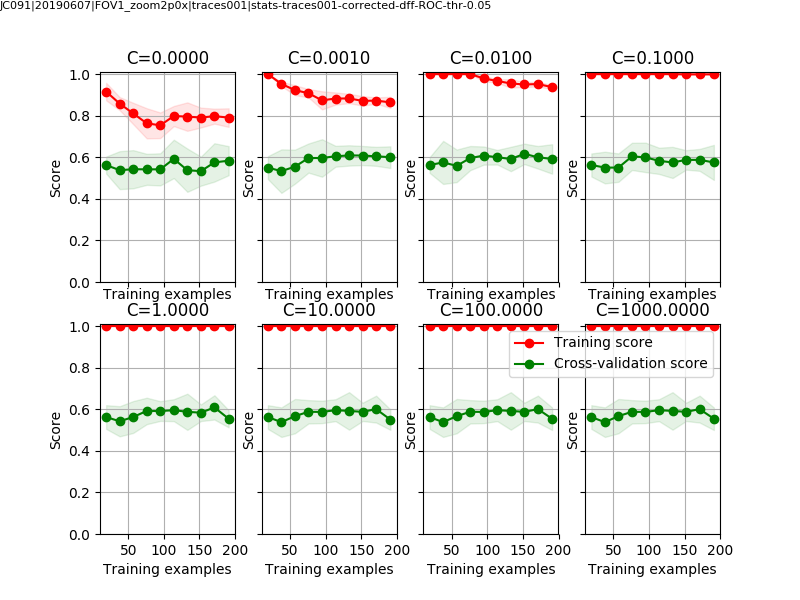

In [105]:

# trainv_x, validate_x, trainv_y, validate_y = train_test_split(
#     train_x, train_y, test_size=0.2, random_state=0)

C_vals = [.000001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]

fig, axes = pl.subplots(2, 4, sharex=True, sharey=True, figsize=(8, 6))
ai = 0
for cval in C_vals:
#     clf = LinearSVC(multi_class='ovr', C=cval, penalty='l2')
#     scores = model_selection.cross_validate(clf, train_x, train_y, cv=5, return_train_score=True)
#     print('%.5f ...Train scores:' % cval, scores['train_score'].mean())
#     print('...Test scores:', scores['test_score'].mean())
    ax=axes.flat[ai]
    plot_learning_curve(LinearSVC(C=cval, multi_class='ovr'), "C=%.4f" % cval, 
                        train_x, train_y, ylim=(0.0, 1.01), cv=5,
                        train_sizes=np.linspace(.1, 1, 10), ax=ax, show_legend=ai==len(C_vals)-1)
    ai += 1
    
label_figure(fig, data_id)

curr_outdir = os.path.join(aggregate_dir, 'blob-classification', stats_desc)
pl.savefig(os.path.join(curr_outdir, 'learning-curves_test-C_%s-%s-fov%i.svg' % (session, animalid, fovnum)))

In [106]:
train_x.shape, len(roi_list)

((240, 133), 133)

In [28]:
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_classif
# SelectKBest(f_classif, k=2) will select the k=2 best features according to their Anova F-value

max_n_features=30
plot_learning_curve(Pipeline([("fs", SelectKBest(f_classif, k=max_n_features)), # select two features
                               ("svc", LinearSVC(C=0.001))]),
                    "SelectKBest(f_classif, k=2) + LinearSVC(C=.001)",
                     scaler.transform(train_x), train_y, ylim=(0., 1.0),
                    train_sizes=np.linspace(.1, 1, 5))

<IPython.core.display.Javascript object>

/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/sklearn/feature_selection/univariate_selection.py:108: RuntimeWarning: invalid value encountered in divide
  msb = ssbn / float(dfbn)


ValueError: This solver needs samples of at least 2 classes in the data, but the data contains only one class: 106

In [29]:
from sklearn.feature_selection import RFECV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline


In [30]:
datakey

'20190612_JC099_fov1'

Optimal number of features : 1


<IPython.core.display.Javascript object>


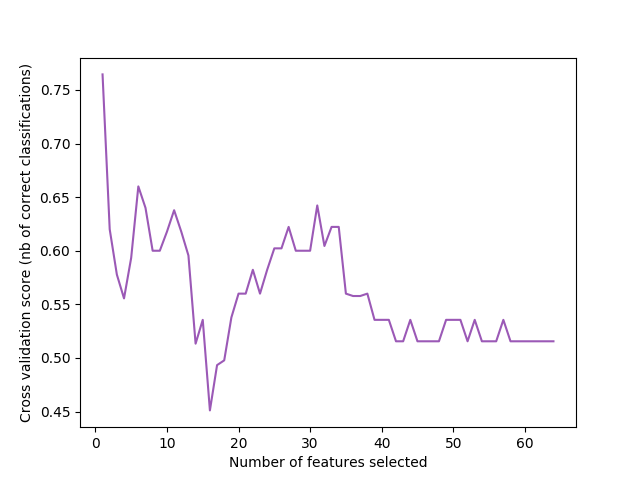

NameError: name 'plt' is not defined

In [31]:
from sklearn.model_selection import StratifiedKFold

train_x_s = scaler.transform(train_x)

# The "accuracy" scoring is proportional to the number of correct
# classifications
svc = LinearSVC(multi_class='ovr')
rfecv = RFECV(estimator=svc, step=1, cv=StratifiedKFold(5),
              scoring='accuracy') #'neg_mean_squared_error') #'mean_absolute_error' #''accuracy')
rfecv.fit(train_x_s, train_y)

print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
pl.figure()
pl.xlabel("Number of features selected")
pl.ylabel("Cross validation score (nb of correct classifications)")
pl.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

In [449]:
train_x.shape

(240, 64)

In [450]:
top_features =rfecv.get_support(indices=True)

<IPython.core.display.Javascript object>


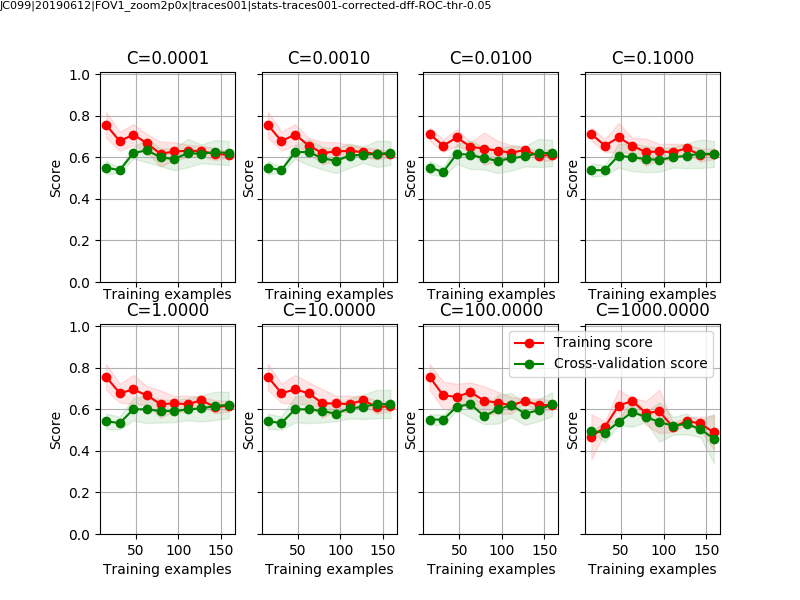

In [451]:

# trainv_x, validate_x, trainv_y, validate_y = train_test_split(
#     train_x, train_y, test_size=0.2, random_state=0)

C_vals = [.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]

fig, axes = pl.subplots(2, 4, sharex=True, sharey=True, figsize=(8, 6))
ai = 0
for cval in C_vals:
#     clf = LinearSVC(multi_class='ovr', C=cval, penalty='l2')
#     scores = model_selection.cross_validate(clf, train_x, train_y, cv=5, return_train_score=True)
#     print('%.5f ...Train scores:' % cval, scores['train_score'].mean())
#     print('...Test scores:', scores['test_score'].mean())
    ax=axes.flat[ai]
    plot_learning_curve(LinearSVC(C=cval, multi_class='ovr'), "C=%.4f" % cval, 
                        train_x_s[:, top_features], train_y, ylim=(0.0, 1.01), #cv=5,
                        train_sizes=np.linspace(.1, 1, 10), ax=ax, show_legend=ai==len(C_vals)-1)
    ai += 1
    
label_figure(fig, data_id)

In [376]:
train_y.shape

(48,)

In [378]:
train_x[:, top_features].shape

(48, 9)

In [ ]:
# Fit SVM:
trained_svc = LinearSVC(multi_class='ovr', C=0.001, penalty='l2').fit(X_train_transformed, y_train)
train_scores.append(trained_svc.score(X_train_transformed, y_train))

# Validate:
X_validate_transformed = scaler.transform(X_validate)
curr_score = trained_svc.score(X_validate_transformed, y_validate)  
val_scores.append(curr_score)
y_pred = trained_svc.predict(X_validate_transformed)


In [ ]:
for curr_sz, curr_color in zip(tested_sizes, size_colors):

    # Set train/test set:
    train_configs = stimdf[((stimdf[class_name].isin(class_types))\
                                & (stimdf[constant_transform]==curr_sz))].index.tolist()
    train_ixs = [i for i, l in enumerate(sample_labels) if l in train_configs]

    X = sample_data.iloc[train_ixs].values #[train_configs]
    y = np.array([stimdf[class_name][c] for c in sample_labels.iloc[train_ixs]])

    # Set test set:
    untrained_class_types = [c for c in stimdf[class_name].unique() if c not in class_types]
    test_configs = stimdf[( (stimdf[constant_transform]==constant_transform_val) & (stimdf[class_name].isin(untrained_class_types)) )].index.tolist()
    test_ixs = [i for i, l in enumerate(sample_labels) if l in test_configs]
    X_test = sample_data.iloc[test_ixs].values
    y_test_labels = sample_labels[test_ixs]

    #% Train/test split
    n_splits = len(X)
    kf = KFold(n_splits=n_splits)
    kf.get_n_splits(X)

    train_scores=[]; val_scores=[];
    test_scores = dict((stimdf[class_name][tc], []) for tc in test_configs)
    choices = dict((tc, []) for tc in tested_morphs)

    for train_index, validate_index in kf.split(X):
        # Get current train/test split data:
        X_train, X_validate = X[train_index], X[validate_index]
        y_train, y_validate = y[train_index], y[validate_index]
        scaler = preprocessing.StandardScaler().fit(X_train)
        X_train_transformed = scaler.transform(X_train)

        # Fit SVM:
        trained_svc = LinearSVC(multi_class='ovr', C=0.01, penalty='l2').fit(X_train_transformed, y_train)
        train_scores.append(trained_svc.score(X_train_transformed, y_train))
        
        # Validate:
        X_validate_transformed = scaler.transform(X_validate)
        curr_score = trained_svc.score(X_validate_transformed, y_validate)  
        val_scores.append(curr_score)
        y_pred = trained_svc.predict(X_validate_transformed)


    print("TRAINING: %.2f (+/- %.2f) | VALIDATION: %.2f (+/- %.2f)" % (np.nanmean(train_scores), spstats.sem(train_scores), np.nanmean(val_scores), spstats.sem(val_scores)))
    
    

In [236]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC

# Split the dataset in two equal parts

trainv_x, validate_x, trainv_y, validate_y = train_test_split(
    train_x, train_y, test_size=0.2, random_state=0)

# Set the parameters by cross-validation
tuned_parameters = [{#'kernel': ['linear'],
                     'C': [.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]}] #,
#                     'penalty': ['l1', 'l2']}]

scores = ['precision', 'recall']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf = GridSearchCV(
        LinearSVC(), tuned_parameters, scoring='%s_macro' % score)
    
    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()



    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()


# Tuning hyper-parameters for precision
()
Best parameters set found on development set:
()
{'C': 1}
()
Grid scores on development set:
()
0.468 (+/-0.358) for {'C': 0.0001}
0.468 (+/-0.358) for {'C': 0.001}
0.419 (+/-0.260) for {'C': 0.01}
0.401 (+/-0.302) for {'C': 0.1}
0.599 (+/-0.345) for {'C': 1}
0.599 (+/-0.345) for {'C': 10}
0.599 (+/-0.345) for {'C': 100}
0.599 (+/-0.345) for {'C': 1000}
()
Detailed classification report:
()
The model is trained on the full development set.
The scores are computed on the full evaluation set.
()
             precision    recall  f1-score   support

          0       0.80      0.47      0.59        17
        106       0.55      0.85      0.67        13

avg / total       0.69      0.63      0.62        30

()
# Tuning hyper-parameters for recall
()
Best parameters set found on development set:
()
{'C': 1}
()
Grid scores on development set:
()
0.554 (+/-0.221) for {'C': 0.0001}
0.554 (+/-0.221) for {'C': 0.001}
0.505 (+/-0.126) for {'C': 0.01}
0.

In [237]:
datakey

'20190612_JC099_fov1'

In [268]:
for curr_sz, curr_color in zip(tested_sizes, size_colors):

    # Set train/test set:
    train_configs = stimdf[((stimdf[class_name].isin(class_types))\
                                & (stimdf[constant_transform]==curr_sz))].index.tolist()
    train_ixs = [i for i, l in enumerate(sample_labels) if l in train_configs]

    X = sample_data.iloc[train_ixs].values #[train_configs]
    y = np.array([stimdf[class_name][c] for c in sample_labels.iloc[train_ixs]])

    # Set test set:
    untrained_class_types = [c for c in stimdf[class_name].unique() if c not in class_types]
    test_configs = stimdf[( (stimdf[constant_transform]==constant_transform_val) & (stimdf[class_name].isin(untrained_class_types)) )].index.tolist()
    test_ixs = [i for i, l in enumerate(sample_labels) if l in test_configs]
    X_test = sample_data.iloc[test_ixs].values
    y_test_labels = sample_labels[test_ixs]

    #% Train/test split
    n_splits = len(X)
    kf = KFold(n_splits=n_splits)
    kf.get_n_splits(X)

    train_scores=[]; val_scores=[];
    test_scores = dict((stimdf[class_name][tc], []) for tc in test_configs)
    choices = dict((tc, []) for tc in tested_morphs)

    for train_index, validate_index in kf.split(X):
        # Get current train/test split data:
        X_train, X_validate = X[train_index], X[validate_index]
        y_train, y_validate = y[train_index], y[validate_index]
        scaler = preprocessing.StandardScaler().fit(X_train)
        X_train_transformed = scaler.transform(X_train)

        # Fit SVM:
        trained_svc = LinearSVC(multi_class='ovr', C=0.01, penalty='l2').fit(X_train_transformed, y_train)
        train_scores.append(trained_svc.score(X_train_transformed, y_train))
        
        # Validate:
        X_validate_transformed = scaler.transform(X_validate)
        curr_score = trained_svc.score(X_validate_transformed, y_validate)  
        val_scores.append(curr_score)
        y_pred = trained_svc.predict(X_validate_transformed)


    print("TRAINING: %.2f (+/- %.2f) | VALIDATION: %.2f (+/- %.2f)" % (np.nanmean(train_scores), spstats.sem(train_scores), np.nanmean(val_scores), spstats.sem(val_scores)))
    
    

TRAINING: 0.91 (+/- 0.00) | VALIDATION: 0.47 (+/- 0.06)
TRAINING: 0.96 (+/- 0.00) | VALIDATION: 0.42 (+/- 0.06)
TRAINING: 0.95 (+/- 0.00) | VALIDATION: 0.52 (+/- 0.07)
TRAINING: 0.98 (+/- 0.00) | VALIDATION: 0.55 (+/- 0.06)
TRAINING: 0.93 (+/- 0.00) | VALIDATION: 0.67 (+/- 0.06)


In [86]:
X_train.shape

(59, 46)

In [69]:

fig, ax = pl.subplots()
fig.patch.set_alpha(1)

skey = '-'.join([animalid, session, fov])
data_id = '|'.join([animalid, session, fov, traceid, stats_desc])

trace_desc = '%s_%s-%s' % (skey, traceid, trace_type)

pdict = dict()
for curr_sz, curr_color in zip(tested_sizes, size_colors):

    if restrict_transform:
        constant_transform_val = curr_sz
        train_configs = stimdf[((stimdf[class_name].isin(class_types)) & (stimdf[constant_transform]==constant_transform_val))].index.tolist()
    else:
        train_configs = stimdf[stimdf[class_name].isin(class_types)].index.tolist()

    # Set train/test set:
    train_ixs = [i for i, l in enumerate(sample_labels) if l in train_configs]

    X = sample_data.iloc[train_ixs].values #[train_configs]
    y = np.array([stimdf[class_name][c] for c in sample_labels[train_ixs]])

    # Set test set:
    untrained_class_types = [c for c in stimdf[class_name].unique() if c not in class_types]
    test_configs = stimdf[( (stimdf[constant_transform]==constant_transform_val) & (stimdf[class_name].isin(untrained_class_types)) )].index.tolist()
    test_ixs = [i for i, l in enumerate(sample_labels) if l in test_configs]
    X_test = sample_data.iloc[test_ixs].values
    y_test_labels = sample_labels[test_ixs]

    #% Train/test split
    n_splits = len(X)
    kf = KFold(n_splits=n_splits)
    kf.get_n_splits(X)

    train_scores=[]; val_scores=[];
    test_scores = dict((stimdf[class_name][tc], []) for tc in test_configs)
    choices = dict((tc, []) for tc in tested_morphs)

    for train_index, validate_index in kf.split(X):
        # Get current train/test split data:
        X_train, X_validate = X[train_index], X[validate_index]
        y_train, y_validate = y[train_index], y[validate_index]
        scaler = preprocessing.StandardScaler().fit(X_train)
        X_train_transformed = scaler.transform(X_train)

        # Fit SVM:
        trained_svc = LinearSVC(multi_class='ovr', C=C).fit(X_train_transformed, y_train)
        train_score.append(trained_svc.score(X_train_transformed, y_train))
        
        # Validate:
        X_validate_transformed = scaler.transform(X_validate)
        curr_score = trained_svc.score(X_validate_transformed, y_validate)  
        val_scores.append(curr_score)
        y_pred = trained_svc.predict(X_validate_transformed)

        # Test scores:
        for true_val, pred_val in zip(y_validate, y_pred):
            choices[true_val].append(pred_val)

        for tc in test_configs:
            X_test_transformed = scaler.transform(X_test[np.where(y_test_labels==tc)[0], :])
            curr_pchoose100 = trained_svc.score(X_test_transformed, [m100 for _ in range(X_test_transformed.shape[0])])  
            test_scores[stimdf[class_name][tc]].append(curr_pchoose100)
            y_pred_test = trained_svc.predict(X_test_transformed)
            choices[stimdf[class_name][tc]].append(y_pred_test)


    print("TRAINING. mean score: %.2f (+/- %.2f)" % (np.mean(train_scores), spstats.sem(train_scores)))
    print("VALIDATION. mean score: %.2f (+/- %.2f)" % (np.mean(val_scores), spstats.sem(val_scores)))
    
    pchoose100={}
    pchoose100_sem={}
    for k, v in choices.items():
        if k in [m0, m100]:
            pchoose100[k] = np.mean(np.sum([i==m100 for i in v]) / float(len(v)))
            pchoose100_sem[k] = np.std([i==m100 for i in v]) / float(len(v))
        else:
            print(v)
            pchoose100[k] = np.mean([np.sum([i==m100 for i in vv]) / float(len(vv)) for vv in v])
            pchoose100_sem[k] = np.std([np.sum([i==m100 for i in vv]) / float(len(vv)) for vv in v])

    curr_label = "[sz %i] %.2f (+/- %.2f)" % (curr_sz, np.mean(scores), spstats.sem(scores))
    for cax in [ax]: # ax2]:
        if -1 in pchoose100.keys():
            cax.plot(sorted(pchoose100.keys())[0], [pchoose100[k] for k in sorted(pchoose100.keys())][0], 'o', \
                markersize=5, lw=lw, color=curr_color, label=curr_label)
            cax.errorbar(sorted(pchoose100.keys())[0], [pchoose100[k] for k in sorted(pchoose100.keys())][0],\
                    yerr=[pchoose100_sem[k] for k in sorted(pchoose100_sem.keys())][0], fmt='none',
                    ecolor=curr_color)

            cax.plot(sorted(pchoose100.keys())[1:], [pchoose100[k] for k in sorted(pchoose100.keys())][1:], '-', \
                    markersize=.5, lw=lw, color=curr_color, label=curr_label)
            cax.errorbar(sorted(pchoose100.keys())[1:], [pchoose100[k] for k in sorted(pchoose100.keys())][1:],\
                        yerr=[pchoose100_sem[k] for k in sorted(pchoose100_sem.keys())][1:], fmt='none',
                        ecolor=curr_color)
        else:
            cax.plot(sorted(pchoose100.keys()), [pchoose100[k] for k in sorted(pchoose100.keys())], '-', \
                    markersize=.5, lw=lw, color=curr_color, label=curr_label)
            cax.errorbar(sorted(pchoose100.keys()), [pchoose100[k] for k in sorted(pchoose100.keys())],\
                        yerr=[pchoose100_sem[k] for k in sorted(pchoose100_sem.keys())], fmt='none',
                        ecolor=curr_color)

        cax.set_ylim([0, 1])
        cax.set_ylabel('% choose morph100')
        cax.set_xlabel('morph')
        cax.set_title('%s | %s (%i-fold)' % (visual_area, skey, n_splits))
        sns.despine(trim=True, offset=4, ax=cax)
    pdict['size_%i' % curr_sz] = {'mean': pchoose100, 'sem': pchoose100_sem}

ax.legend(fontsize=6)

pl.figure(fig.number)
figname = '__TEST_%s_%s_AvsB-linearSVM-LOO' % (visual_area, skey)
pl.savefig(os.path.join(outdir, 'sessions', '%s.png' % figname))
#pl.close()
#ai += 1
print outdir
print figname


<IPython.core.display.Javascript object>

TRAINING. mean score: nan (+/- nan)
VALIDATION. mean score: 0.05 (+/- 0.03)
[array([14, -1, 92]), array([14, -1, 40]), array([14, -1, -1]), array([14, -1, 27]), -1, array([14, -1, 27]), array([14, -1, 92]), array([14, -1, 27]), array([14, -1, 27]), -1, array([14, -1, 27]), array([14, -1, 40]), array([14, -1, 27]), array([14, -1, 27]), array([66, -1, 27]), array([14, -1, 92]), 27, array([14, -1, 27]), array([14, -1, 27]), array([14, -1, 27]), array([ 14,  -1, 106]), array([14, -1, 40]), array([14, -1, 27]), array([14, -1, 40]), array([14, -1, 27]), array([14, -1, 92]), array([ 14,  -1, 106]), array([ 14,  -1, 106]), array([14, -1, 27]), array([14, -1, 40]), array([66, -1, 27]), array([14, -1, 27]), array([14, -1, 40]), array([14, -1, 27]), array([14, -1, 27]), array([14, 79, 27]), 27, array([14, -1, 27]), array([14, -1, 92]), array([14, -1, 79]), array([14, -1, 40]), 106, array([14, -1, 27]), array([14, -1, 27]), array([14, -1,  0]), 66, array([14, -1, 27]), array([14, 79, 79]), array([

/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/numpy/core/_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


TypeError: 'numpy.int64' object is not iterable

In [11]:
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold

In [34]:
# The "accuracy" scoring is proportional to the number of correct
# classifications
svc = LinearSVC(multi_class='ovr', C=C) #.fit(X_train_transformed, y_train)

#n_splits = len(X)
#kf = KFold(n_splits=n_splits)
kf = StratifiedKFold(5)    
    
X = sample_data.iloc[train_ixs].values.copy() #[train_configs]
y = np.array([stimdf[class_name][c] for c in sample_labels[train_ixs]])

rfecv = RFECV(estimator=svc, step=1, cv=kf, scoring='accuracy')
rfecv.fit(X, y)

RFECV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
   estimator=LinearSVC(C=1000.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0),
   n_jobs=1, scoring='accuracy', step=1, verbose=0)

<IPython.core.display.Javascript object>


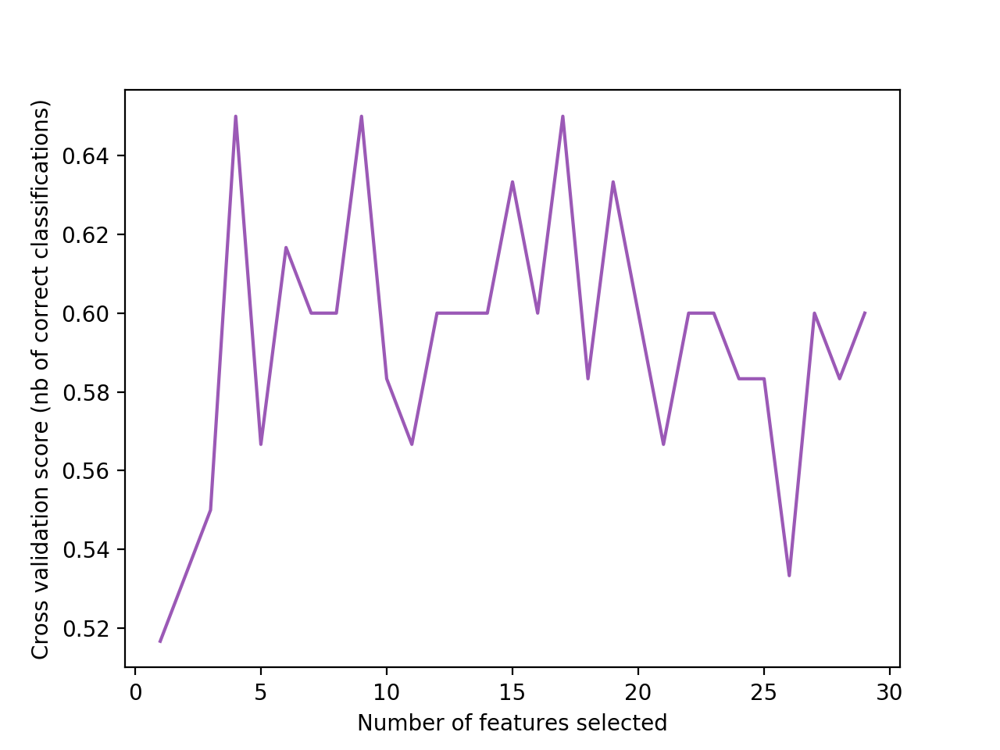

In [35]:
# Plot number of features VS. cross-validation scores
fig, ax = pl.subplots()
ax.set_xlabel("Number of features selected")
ax.set_ylabel("Cross validation score (nb of correct classifications)")
ax.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)


In [37]:
visual_area

'Li'

In [38]:
visual_areas = ['V1', 'Lm', 'Li']

In [39]:
rfe_results = dict((visual_area, dict()) for visual_area in visual_areas)
for visual_area in visual_areas:
    
    sessions = dsets[ dsets['visual_area'] == visual_area ]
    n_datasets = sessions.shape[0]
    
    #thresh_str = 'thr-%.2f' % min_dff if threshold_dff else 'no-thr'
    #sfilename = os.path.join(aggr_stats_dir, '%s_%s_%s-%s.pkl' % (visual_area, experiment_type, response_type, thresh_str))
    #print("Stats: %s" % os.path.split(sfilename)[-1])


    ai = 0
    #ai = 0
    for (animalid, session, fov), g in sessions.groupby(['animalid', 'session', 'fov']):
        
        skey = '-'.join([animalid, session, fov])
            
        data_id = '|'.join([animalid, session, fov, traceid, stats_desc])
        
        exp = util.Objects(animalid, session, fov, traceid=traceid, rootdir=rootdir)    
        # Get stimulus conditions
        sdf = exp.get_stimuli()
        sdf = reformat_morph_values(sdf)
        #print sdf.head()
        tested_sizes = np.array(sorted(sdf['size'].unique()))
        tested_morphs = np.array(sorted(sdf['morphlevel'].unique()))

        sdf = reformat_morph_values(sdf)        
        n_sizes = len(tested_sizes)
        n_morphs = len(tested_morphs)
        if n_sizes != n_sz or n_morphs != n_mp:
            incorrect_nvalues.append(skey)
            pass

        trace_desc = '%s_%s-%s' % (skey, traceid, trace_type)
        tfilename = os.path.join(aggr_tcourse_dir, '%s_%s.pkl' % (visual_area, trace_desc))
        print("Timecourse: %s" % os.path.split(tfilename)[-1])
        #load_data=False
        try:
            with open(tfilename, 'rb') as f:
                exp = pkl.load(f)
                assert exp.data is not None and 'traces' in dir(exp.data)
                sdf = exp.data.sdf.copy()
        except Exception as e:
            load_data = True

        sdf = reformat_morph_values(sdf)

        # Get metrics for each condition
        estats = exp.get_stats(responsive_test=responsive_test, responsive_thr=responsive_thr, n_stds=n_stds)
        meanr = pd.concat([pd.Series(estats.gdf.get_group(roi).groupby(['config']).mean()['dff'], name=roi) \
                           for roi in estats.rois], axis=1).T

        # Get ROI list
        if threshold_dff:
            rois_plot = meanr[(meanr.max(axis=1) > min_dff)].index.tolist()
        else:
            rois_plot = meanr.index.tolist()
        print("Plotting %i of %i responsive cells." % (len(rois_plot), len(meanr.index.tolist())))

        sample_data = pd.concat([pd.DataFrame(roidf[response_type].values, columns=[roi],
                                              index=roidf['config']) for roi, roidf in estats.gdf], axis=1)
        sample_data = sample_data[rois_plot]
        sample_labels = np.array(sample_data.index.tolist())


        #stimdf = sdf[sdf['morphlevel'] != -1]
        stimdf = sdf.copy()

        #% Specify train/test conditions:     
        class_name = 'morphlevel'
        class_types = [0, 106]
        restrict_transform = True
        constant_transform = 'size'

        C = 1e3
        m0 = 0
        m100 = 106
        #fig, ax = pl.subplots()

        size_colors = sns.cubehelix_palette(len(tested_sizes))
        lw=2

        res = []
        size_colors = sns.cubehelix_palette(len(tested_sizes))
        lw=2
        pdict = dict()
        for curr_sz, curr_color in zip(tested_sizes, size_colors):

            if restrict_transform:
                constant_transform_val = curr_sz
                train_configs = stimdf[((stimdf[class_name].isin(class_types)) & (stimdf[constant_transform]==constant_transform_val))].index.tolist()
            else:
                train_configs = stimdf[stimdf[class_name].isin(class_types)].index.tolist()

            # Set train/test set:
            train_ixs = [i for i, l in enumerate(sample_labels) if l in train_configs]

            X = sample_data.iloc[train_ixs].values #[train_configs]
            y = np.array([stimdf[class_name][c] for c in sample_labels[train_ixs]])

            # The "accuracy" scoring is proportional to the number of correct
            # classifications
            svc = LinearSVC(multi_class='ovr', C=C) #.fit(X_train_transformed, y_train)

            #n_splits = len(X)
            #kf = KFold(n_splits=n_splits)
            kf = StratifiedKFold(5)    

            rfecv = RFECV(estimator=svc, step=1, cv=kf, scoring='accuracy')
            rfecv.fit(X, y)            
            
            res.append((curr_sz, rfecv.grid_scores_))
        
        rfe_results[visual_area][skey] = res

... [JC076|20190420|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
Timecourse: V1_JC076-20190420-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 163 of 175 responsive cells.
... [JC076|20190501|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
Timecourse: V1_JC076-20190501-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 168 of 189 responsive cells.
... [JC083|20190507|FOV1_zoom2p0x] creating blobs object
... getting data path

Plotting 214 of 226 responsive cells.
... [JC083|20190508|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
Timecourse: Lm_JC083-20190508-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 161 of 171 responsive cells.
... [JC083|20190512|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
Timecourse: Lm_JC083-20190512-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 253 of 266 responsive cells.
... [JC083|20190517|FOV1_zoom2p0x] creat

Plotting 22 of 82 responsive cells.
... [JC120|20191111|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
Timecourse: Li_JC120-20191111-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 29 of 29 responsive cells.


In [46]:
rfe_results.keys()

['V1', 'Lm', 'Li']

In [47]:
for visual_area, res in rfe_results.items():
    visual_area

In [43]:
[v.shape for k, v in scores]

TypeError: 'numpy.float64' object is not iterable

In [44]:
np.array([v for k, v in scores]).mean(axis=0).shape

TypeError: 'numpy.float64' object is not iterable

In [48]:
datestr = '20191211'

<IPython.core.display.Javascript object>


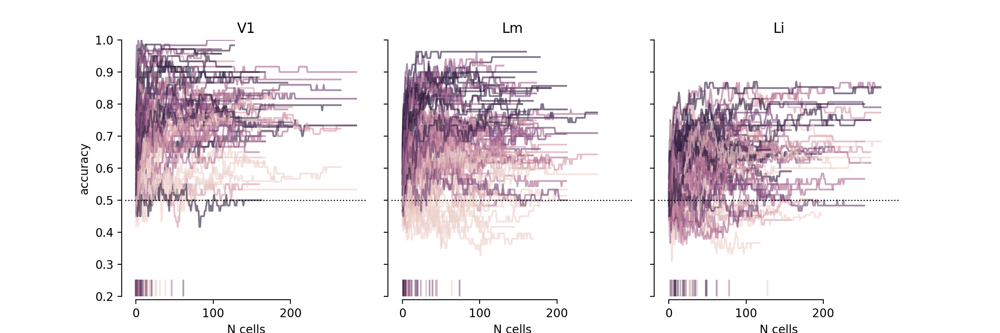

In [50]:

fig, axes = pl.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)

for ax, visual_area in zip(axes.flat, visual_areas):
    res = rfe_results[visual_area]

    sdict = dict((sz, []) for sz in tested_sizes)
    for skey, scores in res.items():
        for (sz, acc) in scores:
            si = list(tested_sizes).index(sz)
            sdict[sz].append(acc)
            #print skey, len(acc)
            ax.plot(range(len(acc)), acc, color=size_colors[si], alpha=0.6)

            acc_thr = np.where(acc>=0.7)[0]
            if len(acc_thr) > 0:
                acc_thr_val = int(acc_thr[0])
                ax.plot([acc_thr_val, acc_thr_val], [0, 0.25], color=size_colors[si], alpha=0.5)
        
    ax.set_title(visual_area)
    
    
for ai, ax in enumerate(axes.flat):
    ax.set_ylim([0.2, 1])
    ax.axhline(y=0.5, linestyle=':', linewidth=1, alpha=1, color='k')
    sns.despine(trim=True, offset=3)
    ax.set_xlabel('N cells')
    if ai==0:
        ax.set_ylabel('accuracy')

pl.subplots_adjust(wspace=0.1)

figname = 'RFEC-plot-each-size_linearSVM-AvsB_stratified-5-fold_%s' % datestr
pl.savefig(os.path.join(outdir, '%s.svg' % figname))
pl.savefig(os.path.join(outdir, '%s.png' % figname))

In [155]:
spstats.sem(np.array([v for k, v in scores]), axis=0)

array([0.02      , 0.01900292, 0.03118048, 0.04960959, 0.04960959,
       0.03045944, 0.03009245, 0.02905933, 0.0254951 , 0.02321398,
       0.02297341, 0.01870829, 0.02198484, 0.01333333, 0.01870829,
       0.02013841, 0.01699673, 0.02357023, 0.02818589, 0.0227303 ,
       0.02134375, 0.0214735 , 0.02614065, 0.02013841, 0.0254951 ,
       0.03778595, 0.02392117, 0.03100179, 0.0335824 , 0.03551213,
       0.03763863, 0.03391165, 0.03265986, 0.02635231, 0.01929306,
       0.0254951 , 0.02108185, 0.0265623 , 0.02472066, 0.03045944,
       0.03231787, 0.03374743, 0.03045944, 0.03519785, 0.02581989,
       0.02718251, 0.03009245, 0.0335824 , 0.02953341, 0.02013841,
       0.02013841, 0.02738613, 0.01943651, 0.02198484, 0.02      ,
       0.02041241, 0.02333333, 0.02013841, 0.01900292, 0.01900292,
       0.02581989, 0.0214735 , 0.01870829, 0.01615893, 0.01178511,
       0.01      , 0.01527525, 0.01825742, 0.02134375, 0.01394433,
       0.01130388, 0.01929306, 0.01748015, 0.01545603, 0.02068

In [53]:
with open(os.path.join(outdir, 'rfe-results_%s.png' % datestr), 'wb') as f:
    pkl.dump(rfe_results, f, protocol=pkl.HIGHEST_PROTOCOL)
    

<IPython.core.display.Javascript object>


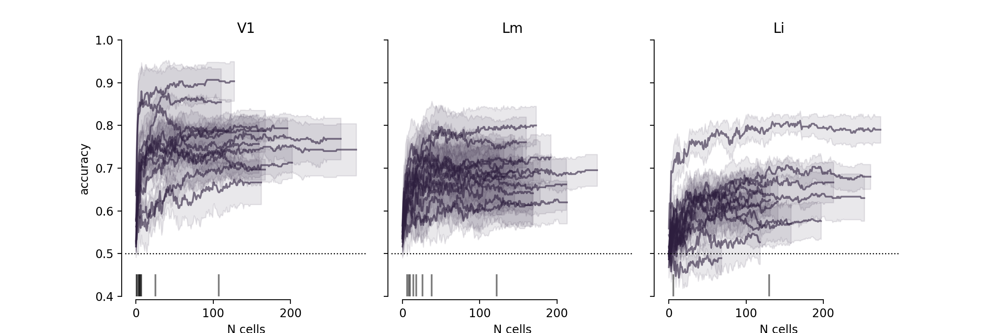

In [51]:
visual_area = 'V1'

fig, axes = pl.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)

for ax, visual_area in zip(axes.flat, visual_areas):
    res = rfe_results[visual_area]

    for skey, scores in res.items():
        mean_score = np.array([v for k, v in scores]).mean(axis=0)
        sem_score = spstats.sem(np.array([v for k, v in scores]), axis=0)
        ax.plot(range(len(mean_score)), mean_score, color=size_colors[si], alpha=0.6)
        ax.fill_between(range(len(mean_score)), mean_score+sem_score,
                        mean_score-sem_score, color=size_colors[si], alpha=0.1)
        
        acc_thr = np.where(mean_score>=0.7)[0]
        if len(acc_thr) > 0:
            acc_thr_val = int(acc_thr[0])
            ax.plot([acc_thr_val, acc_thr_val], [0, 0.45], color='k', alpha=0.5)
        
    ax.set_title(visual_area)
    
for ai, ax in enumerate(axes.flat):
    ax.set_ylim([0.4, 1])
    ax.axhline(y=0.5, linestyle=':', linewidth=1, alpha=1, color='k')
    sns.despine(trim=True, offset=3)
    ax.set_xlabel('N cells')
    if ai==0:
        ax.set_ylabel('accuracy')

pl.subplots_adjust(wspace=0.1)

figname = 'RFEC-average-across-size_linearSVM-AvsB_stratified-5-fold_%s' % datestr
pl.savefig(os.path.join(outdir, '%s.svg' % figname))
pl.savefig(os.path.join(outdir, '%s.png' % figname))

In [164]:
outdir

'/n/coxfs01/julianarhee/aggregate-visual-areas/blob-classification/stats-traces001-corrected-dff-nstds-thr-10.00'

<IPython.core.display.Javascript object>


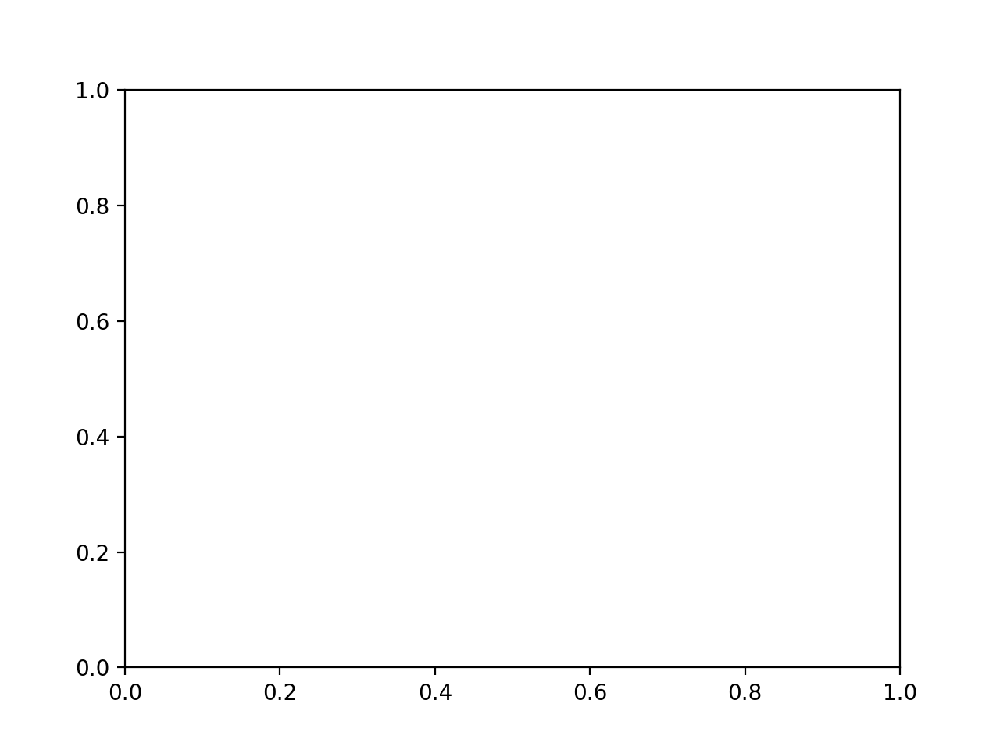

ValueError: operands could not be broadcast together with shapes (214,) (159,) 

In [52]:
fig, ax = pl.subplots()
for sz, arrl in sdict.items():
    sdict[sz] = np.array(arrl) # n_datasets x n_rois
    si = list(tested_sizes).index(sz)
    nr = sdict[sz].shape[-1]
    mean_scores =  sdict[sz].mean(axis=0)
    sem_scores = sdict[sz].std(axis=0)
    
    ax.plot(range(nr), mean_scores, color=size_colors[si])
    #ax.fill_between(range(nr), sdict[sz].mean(axis=0), color=size_colors[si])

(168,)

In [30]:
tested_sizes = sorted(sdf['size'].unique())
tested_morphs = sorted(sdf['morphlevel'].unique())

In [31]:
print tested_sizes

[10.0, 20.0, 30.0, 40.0, 50.0]


In [32]:
print tested_morphs

[-1, 0, 14, 27, 40, 53, 66, 79, 92, 106]


In [122]:
size_colors

[[0.9312692223325372, 0.8201921796082118, 0.7971480974663592],
 [0.8314793143949643, 0.5987041921652179, 0.6530062709235388],
 [0.6672565752652589, 0.40671838146419587, 0.5620016466433286],
 [0.43082755198027817, 0.24984535814964698, 0.44393960899639856],
 [0.1750865648952205, 0.11840023306916837, 0.24215989137836502]]

In [15]:
if not os.path.exists(os.path.join(outdir, 'sessions')):
    os.makedirs(os.path.join(outdir, 'sessions'))
print(os.path.join(outdir, 'sessions'))

/n/coxfs01/julianarhee/aggregate-visual-areas/blob-classification/stats-traces001-corrected-dff-nstds-thr-10.00/sessions


# Get aggregate stats

In [18]:
experiment_type = 'blobs'

visual_areas = ['V1', 'Lm', 'Li']
aggr_tcourse_dir = os.path.join(aggregate_dir, 'data-stats', 'experiment-objects', experiment_type)
aggr_stats_dir = os.path.join(aggregate_dir, 'data-stats', stats_desc)

if not os.path.exists(aggr_tcourse_dir):
    os.makedirs(aggr_tcourse_dir)
if not os.path.exists(aggr_stats_dir):
    os.makedirs(aggr_stats_dir)

In [13]:
tested_morphs

NameError: name 'tested_morphs' is not defined

In [34]:
stimdf

,color,morphlevel,object,size,stimtype,xpos,ypos,yrot
config001,0.08,-1,control,10.0,image,None,None,0
config002,0.2,-1,control,20.0,image,None,None,0
config003,0.32,-1,control,30.0,image,None,None,0
config004,0.44,-1,control,40.0,image,None,None,0
config005,0.56,-1,control,50.0,image,None,None,0
config006,,0,Blob_N1,10.0,image,30,-5,0
config007,,0,Blob_N1,20.0,image,30,-5,0
config008,,0,Blob_N1,30.0,image,30,-5,0
config009,,0,Blob_N1,40.0,image,30,-5,0
config010,,0,Blob_N1,50.0,image,30,-5,0


In [16]:
visual_areas = ['V1', 'Lm', 'Li']

# Classify morphs LOO at each size

Stats: V1_blobs_dff-no-thr.pkl
[]


<IPython.core.display.Javascript object>


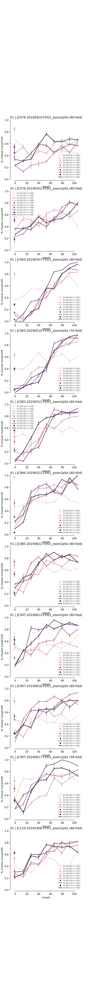

<IPython.core.display.Javascript object>


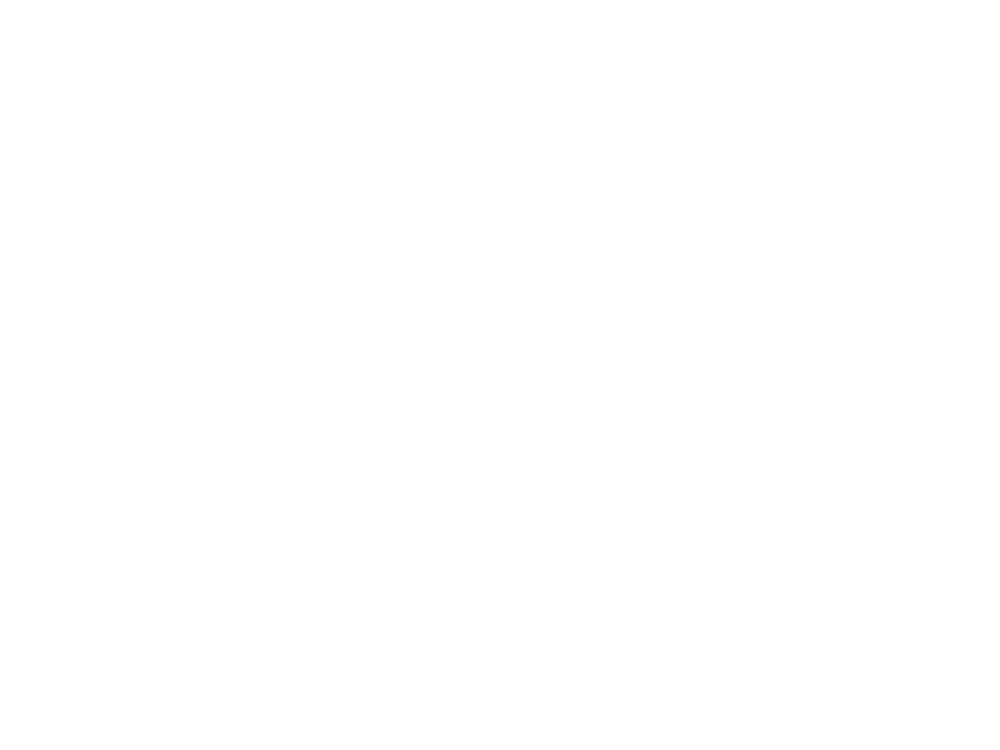

... [JC076|20190420|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC076-20190420-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC076/20190420/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_5ffca7_traces001_09c921_traces001_512e96_traces001_394d78_traces001_64e684_traces001_6bacb1/data_arrays/np_subtracted.npz
NP_subtracted offset was: 58.87
adding NP offset... (NP baseline offset: 289.30)
((249

<IPython.core.display.Javascript object>


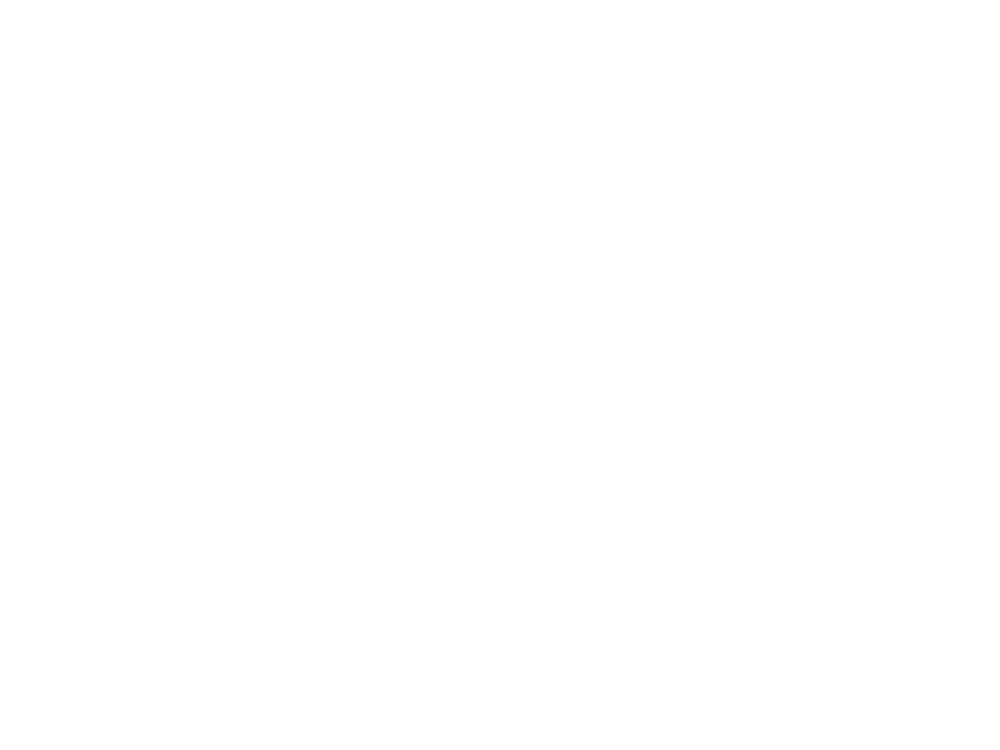

... [JC076|20190501|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC076-20190501-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC076/20190501/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_8bada5_traces001_f32281_traces001_8843f0_traces001_8c6f4b_traces001_62f205_traces001_185b69/data_arrays/np_subtracted.npz
NP_subtracted offset was: 90.59
adding NP offset... (NP baseline offset: 347.18)
((268

<IPython.core.display.Javascript object>


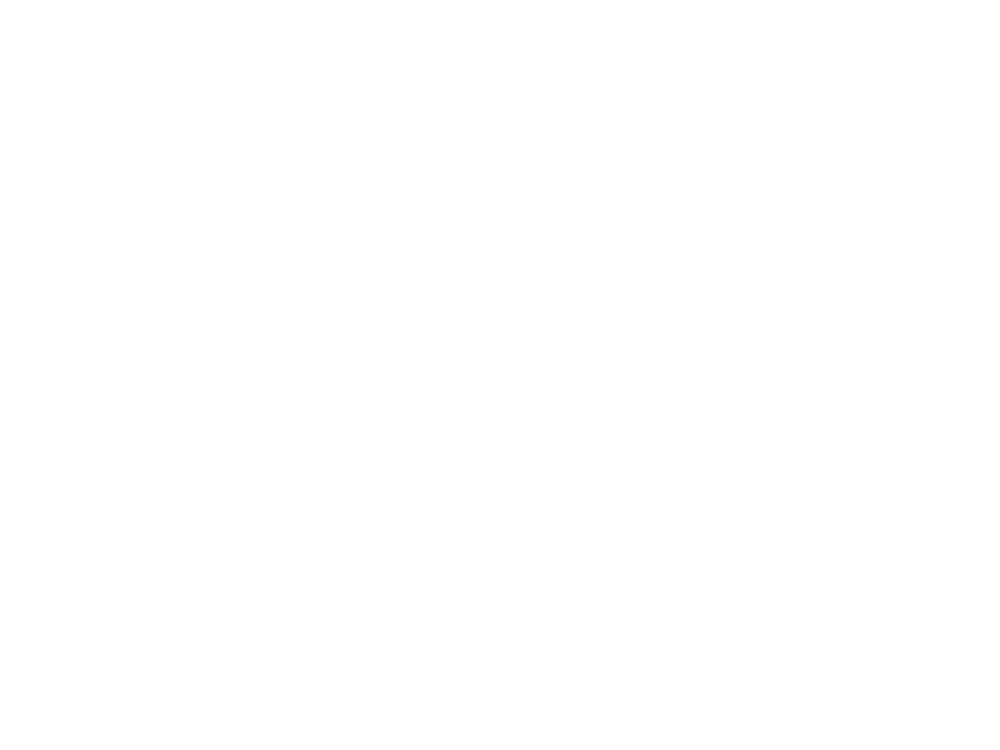

... [JC083|20190507|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC083-20190507-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC083/20190507/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_8afe5f_traces001_7ab5af_traces001_488b31_traces001_c8dfc7_traces001_df5b92_traces001_431894/data_arrays/np_subtracted.npz
NP_subtracted offset was: 77.17
adding NP offset... (NP baseline offset: 413.01)
((268

<IPython.core.display.Javascript object>


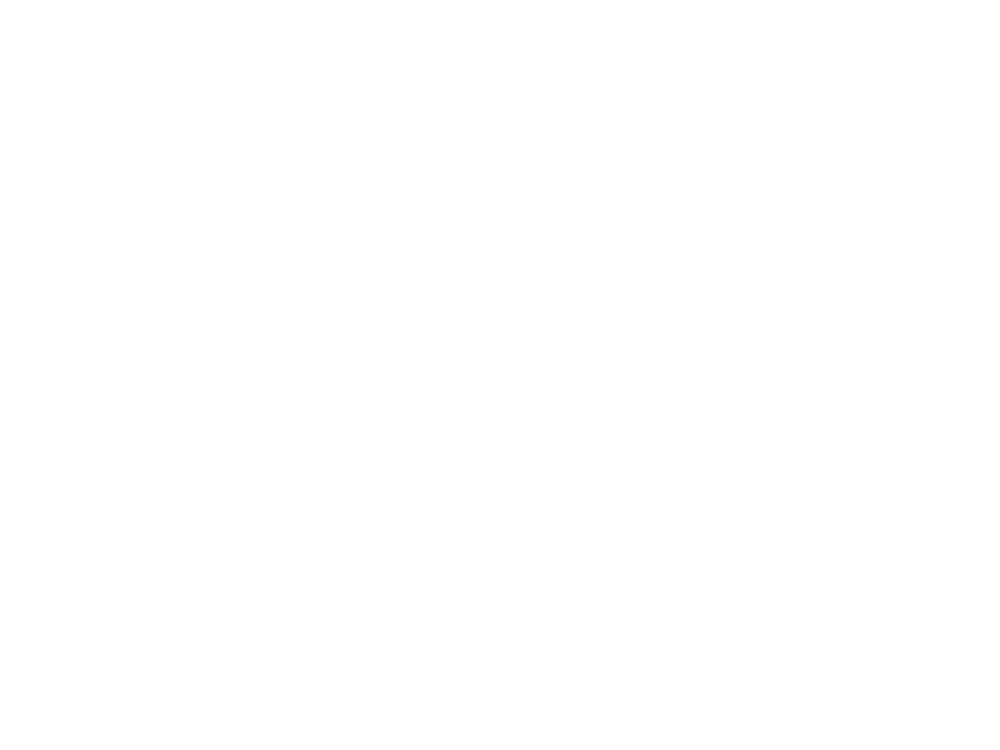

... [JC083|20190510|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC083-20190510-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC083/20190510/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_54393b_traces001_0152b8_traces001_d41efc_traces001_cd9df6_traces001_aab980_traces001_84e961_traces001_ba9020/data_arrays/np_subtracted.npz
NP_subtracted offset was: 60.57
adding NP offset... (NP baseline offs

<IPython.core.display.Javascript object>


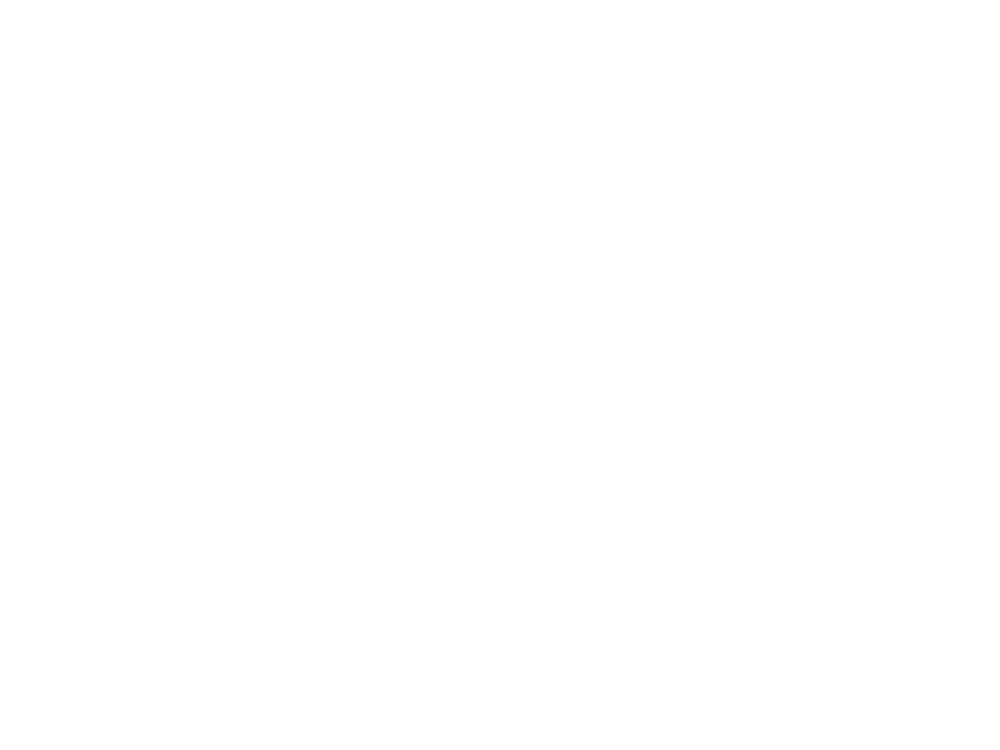

... [JC083|20190511|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC083-20190511-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC083/20190511/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_95dedb_traces001_e403bc_traces001_78845b_traces001_045759_traces001_e7bfd6_traces001_c43fca/data_arrays/np_subtracted.npz
NP_subtracted offset was: 95.94
adding NP offset... (NP baseline offset: 430.59)
((268

<IPython.core.display.Javascript object>


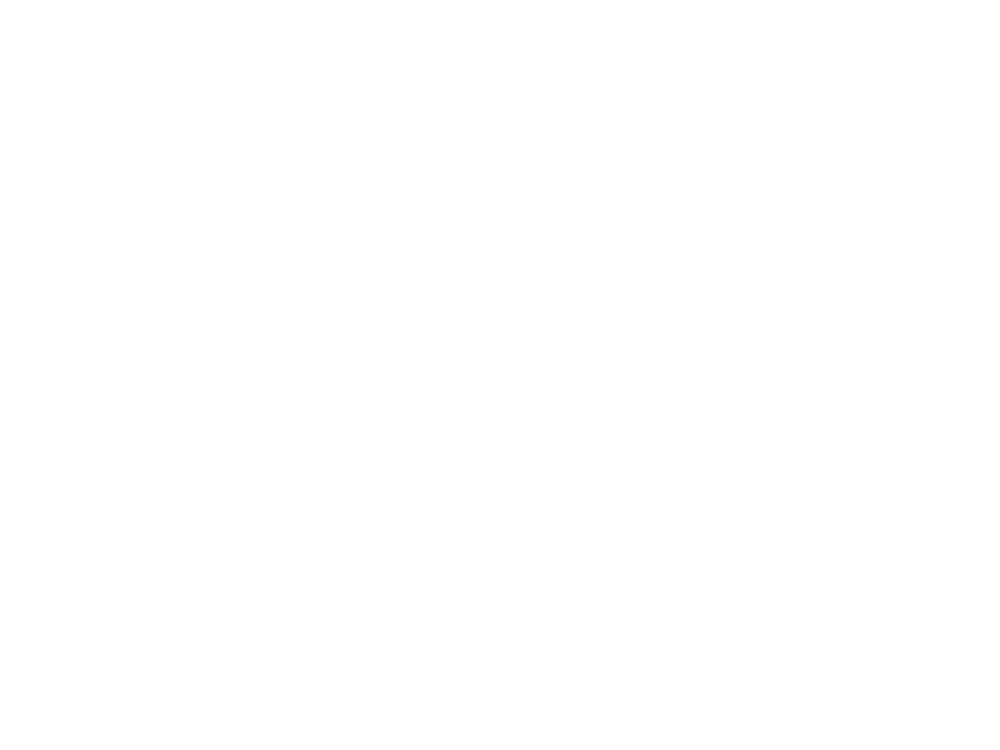

... [JC084|20190522|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC084-20190522-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_ea0b53_traces001_92d492_traces001_af4cfd_traces001_9188fa_traces001_b44714_traces001_133108/data_arrays/np_subtracted.npz
NP_subtracted offset was: 87.95
adding NP offset... (NP baseline offset: 588.05)
((268

<IPython.core.display.Javascript object>


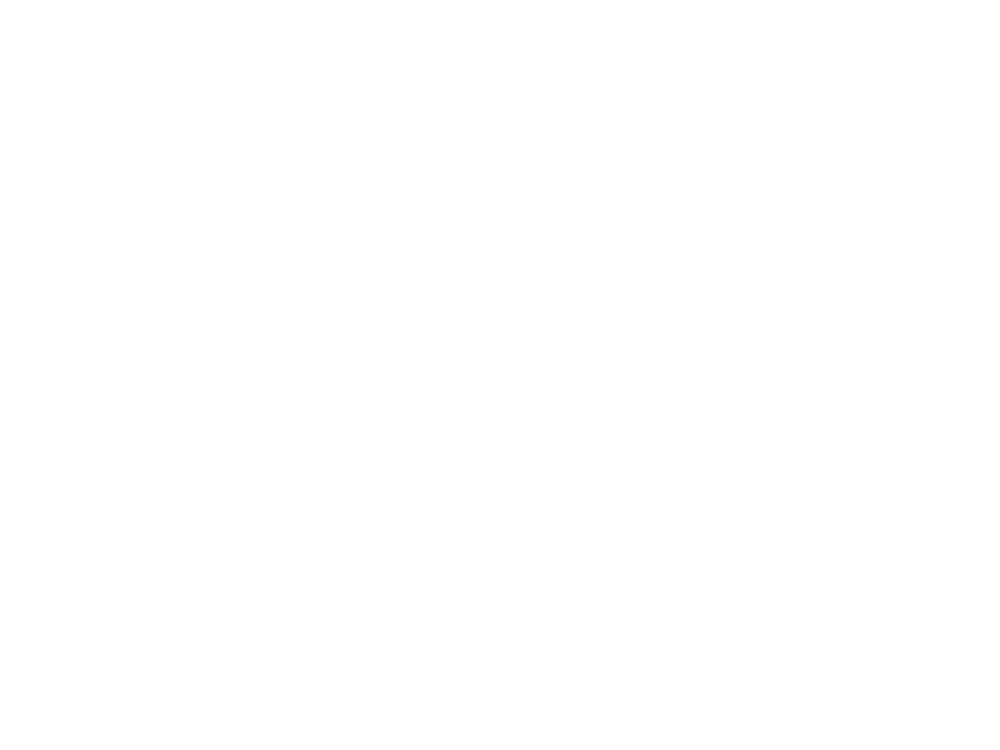

... [JC085|20190622|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC085-20190622-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC085/20190622/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_6da5ed_traces001_19b5de_traces001_565a1c_traces001_238b5b_traces001_cb35ec_traces001_6537ce/data_arrays/np_subtracted.npz
NP_subtracted offset was: 17.52
adding NP offset... (NP baseline offset: 493.40)
((202

<IPython.core.display.Javascript object>


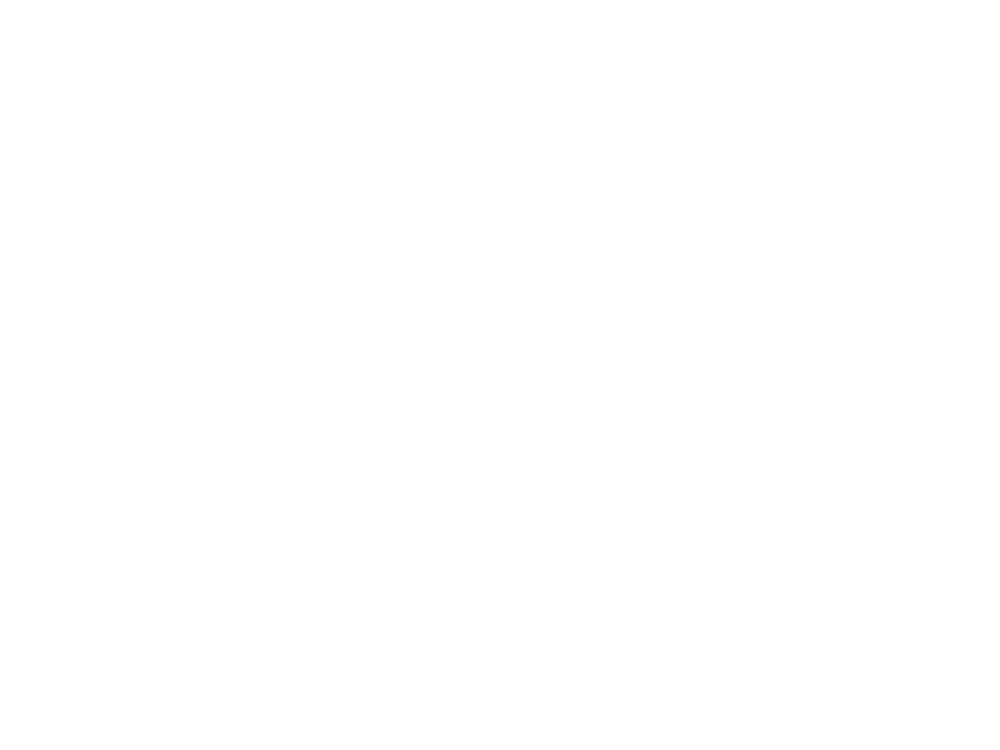

... [JC097|20190613|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC097-20190613-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC097/20190613/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_b92766_traces001_02482e_traces001_b1d533_traces001_f15eef_traces001_ccd355_traces001_b8ae95/data_arrays/np_subtracted.npz
NP_subtracted offset was: 156.56
adding NP offset... (NP baseline offset: 695.61)
((20

<IPython.core.display.Javascript object>


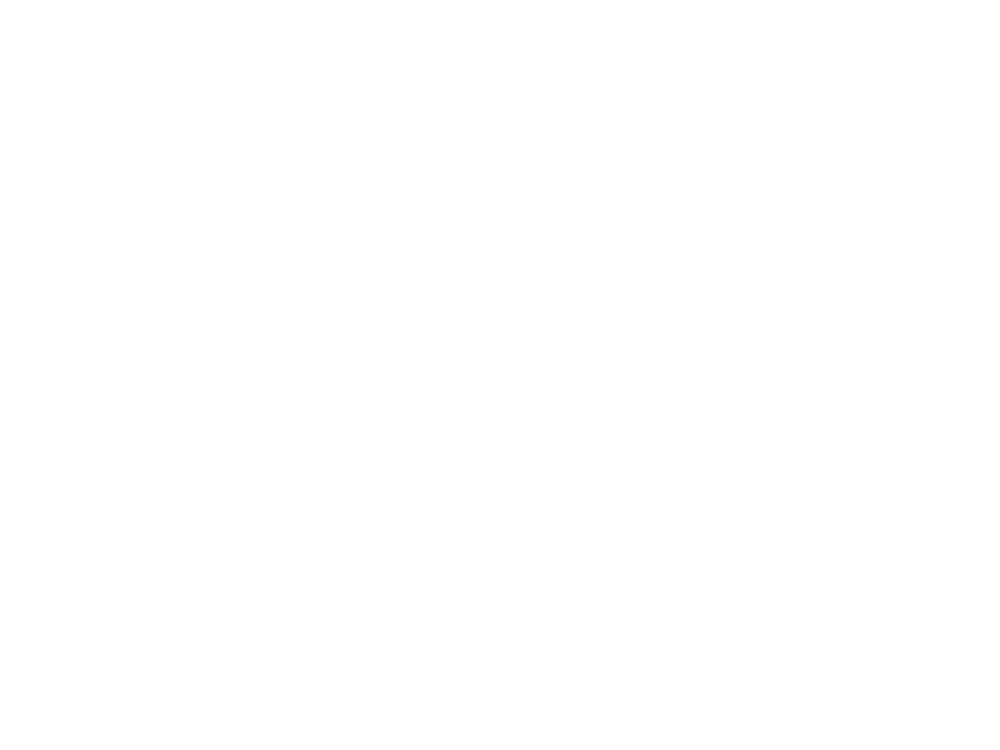

... [JC097|20190616|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC097-20190616-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC097/20190616/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_d1a2cd_traces001_a13a76_traces001_0a4432_traces001_6fc2ca_traces001_2449cf_traces001_70650b/data_arrays/np_subtracted.npz
NP_subtracted offset was: 224.97
adding NP offset... (NP baseline offset: 852.07)
((20

<IPython.core.display.Javascript object>


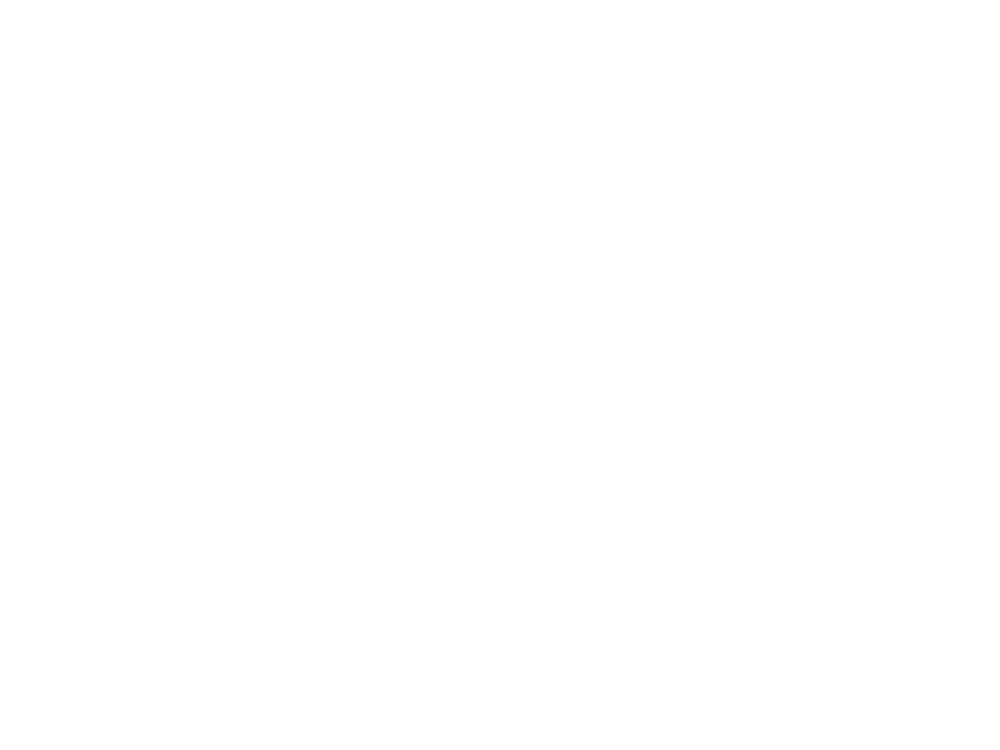

... [JC097|20190617|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC097-20190617-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC097/20190617/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_90a1e8_traces001_99c4ae_traces001_f2cdc2_traces001_f92243_traces001_c53295_traces001_7673a4/data_arrays/np_subtracted.npz
NP_subtracted offset was: 157.46
adding NP offset... (NP baseline offset: 853.19)
((19

<IPython.core.display.Javascript object>


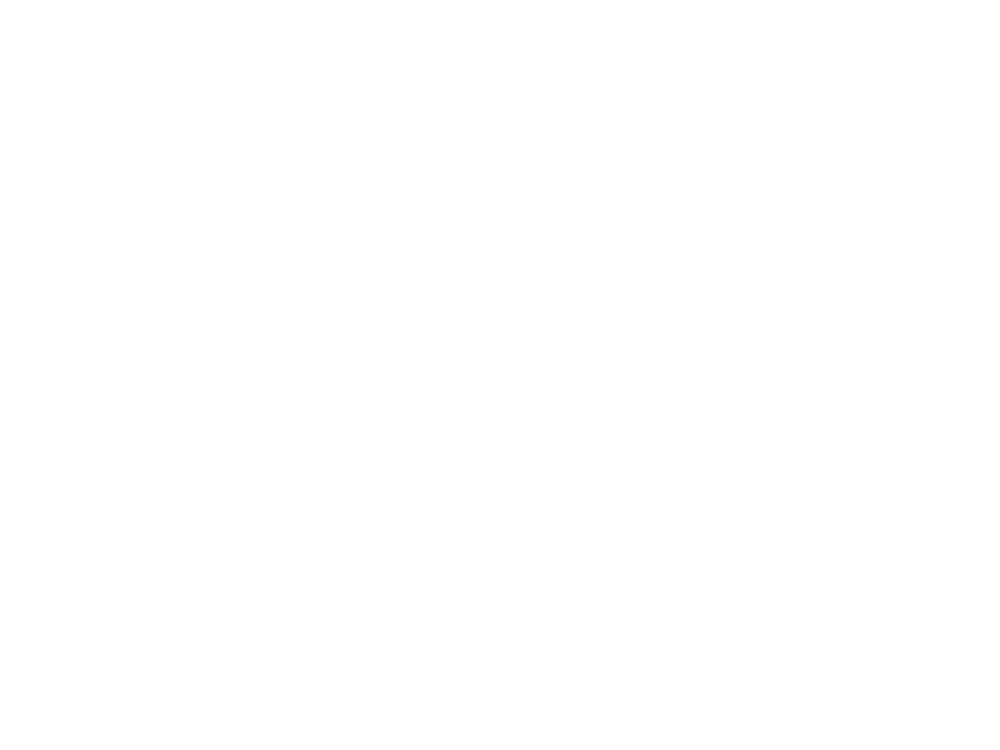

... [JC110|20191006|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: V1_JC110-20191006-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC110/20191006/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_3b3744_traces001_1990cb_traces001_58a59f_traces001_c760ae_traces001_00f36c_traces001_6f6bcc_traces001_13f7f0/data_arrays/np_subtracted.npz
NP_subtracted offset was: 89.39
adding NP offset... (NP baseline offs

<IPython.core.display.Javascript object>


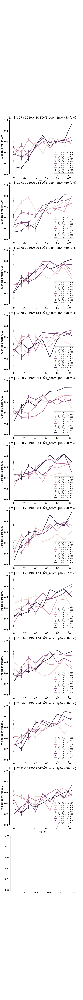

<IPython.core.display.Javascript object>


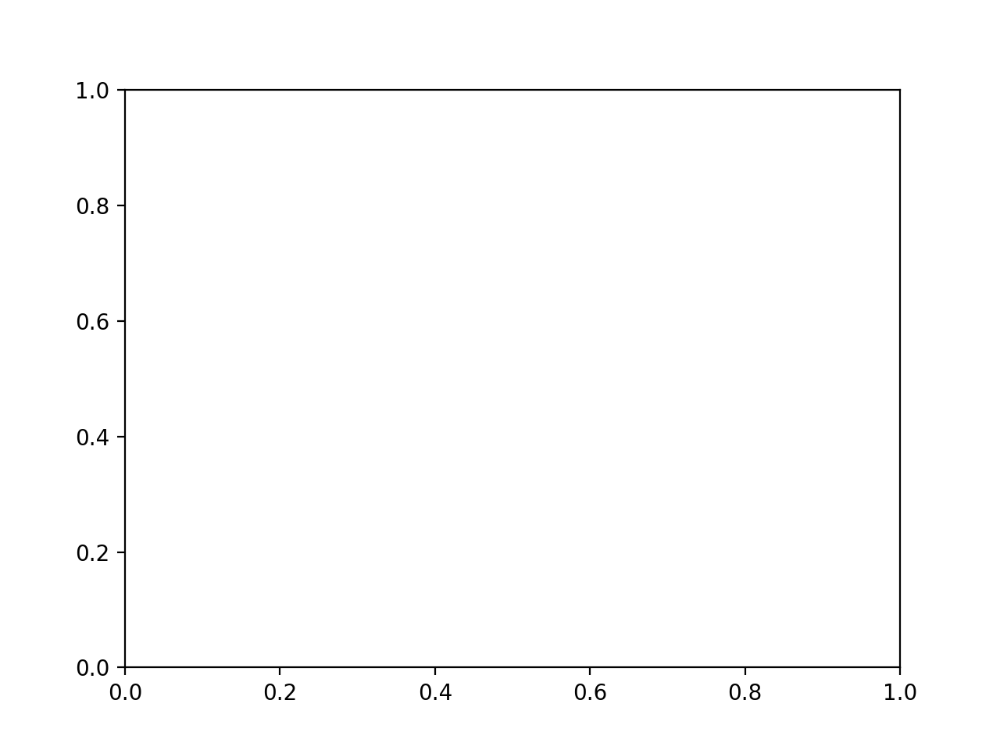

<IPython.core.display.Javascript object>


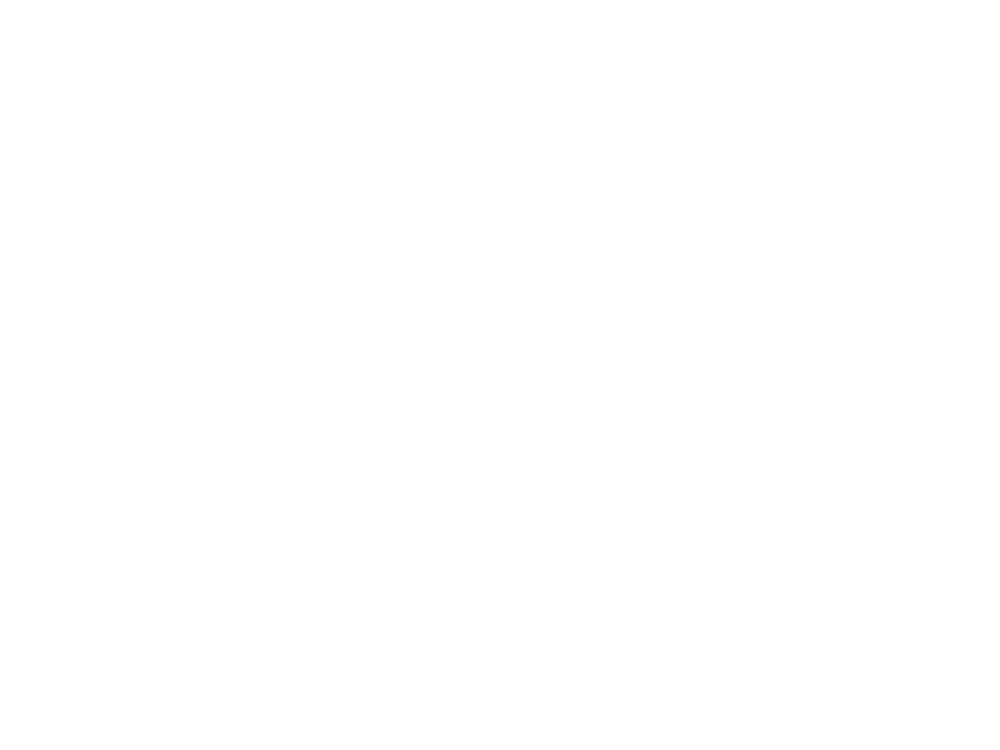

... [JC078|20190430|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC078-20190430-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC078/20190430/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_dfb5b6_traces001_929bd6_traces001_383b98_traces001_e649db_traces001_9a1a48_traces001_f5276a/data_arrays/np_subtracted.npz
NP_subtracted offset was: 214.94
adding NP offset... (NP baseline offset: 843.92)
((26

<IPython.core.display.Javascript object>


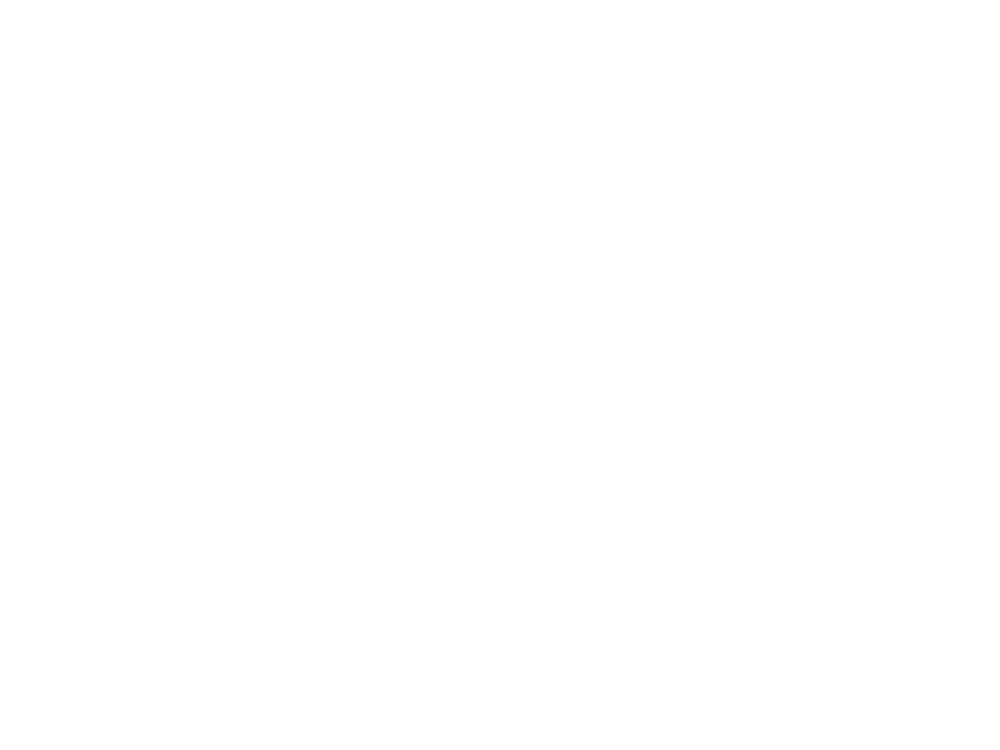

... [JC078|20190504|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC078-20190504-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC078/20190504/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_830af1_traces001_241385_traces001_4f577b_traces001_8a5bd2_traces001_af220b_traces001_f47906/data_arrays/np_subtracted.npz
NP_subtracted offset was: 148.49
adding NP offset... (NP baseline offset: 436.83)
((26

<IPython.core.display.Javascript object>


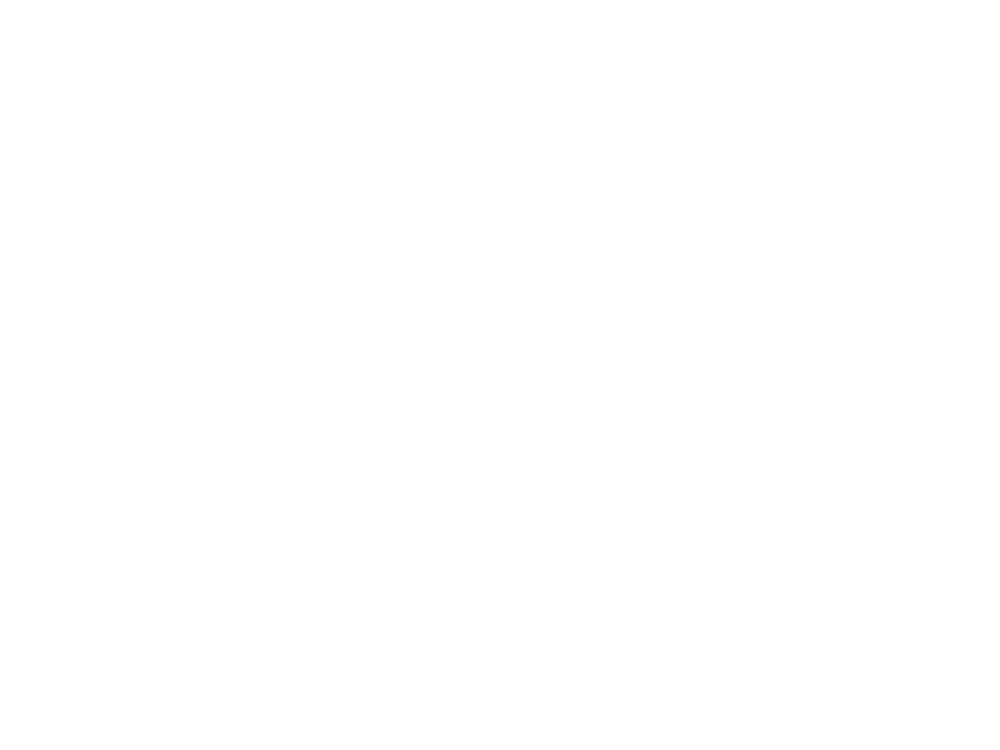

... [JC078|20190509|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC078-20190509-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC078/20190509/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_d242e7_traces001_37b7c0_traces001_dcf502_traces001_50495c_traces001_b5b103_traces001_31048d/data_arrays/np_subtracted.npz
NP_subtracted offset was: 103.98
adding NP offset... (NP baseline offset: 374.32)
((26

<IPython.core.display.Javascript object>


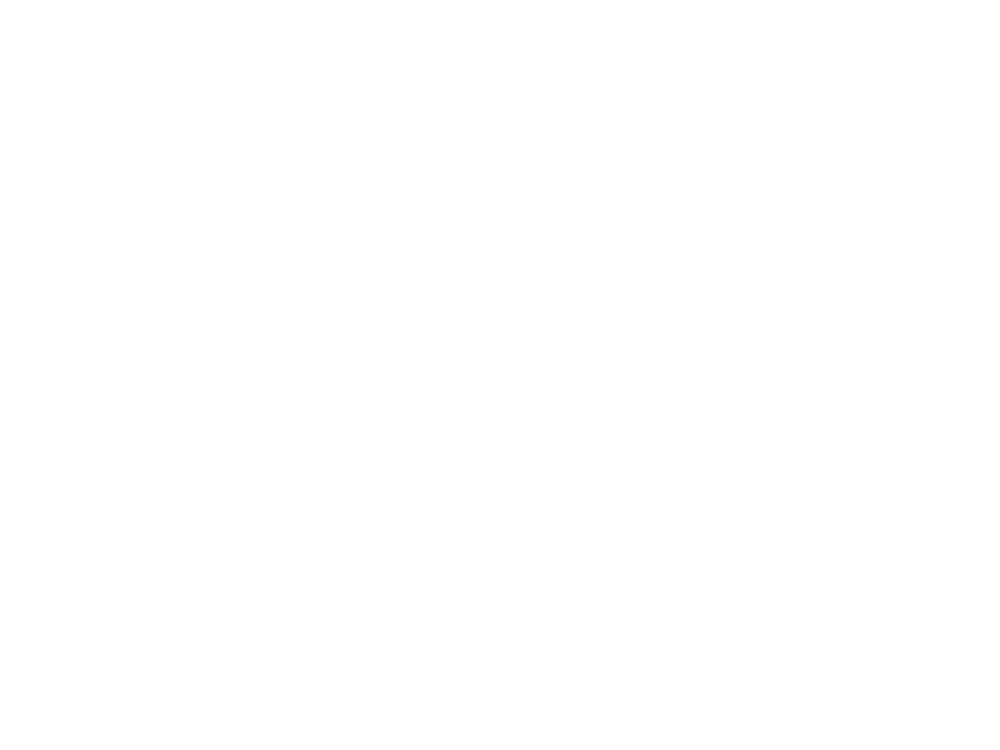

... [JC078|20190513|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC078-20190513-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC078/20190513/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_23404b_traces001_f36dbe_traces001_ece5a1_traces001_c7edbd_traces001_ba61ae_traces001_1ef319/data_arrays/np_subtracted.npz
NP_subtracted offset was: 124.21
adding NP offset... (NP baseline offset: 595.66)
((19

<IPython.core.display.Javascript object>


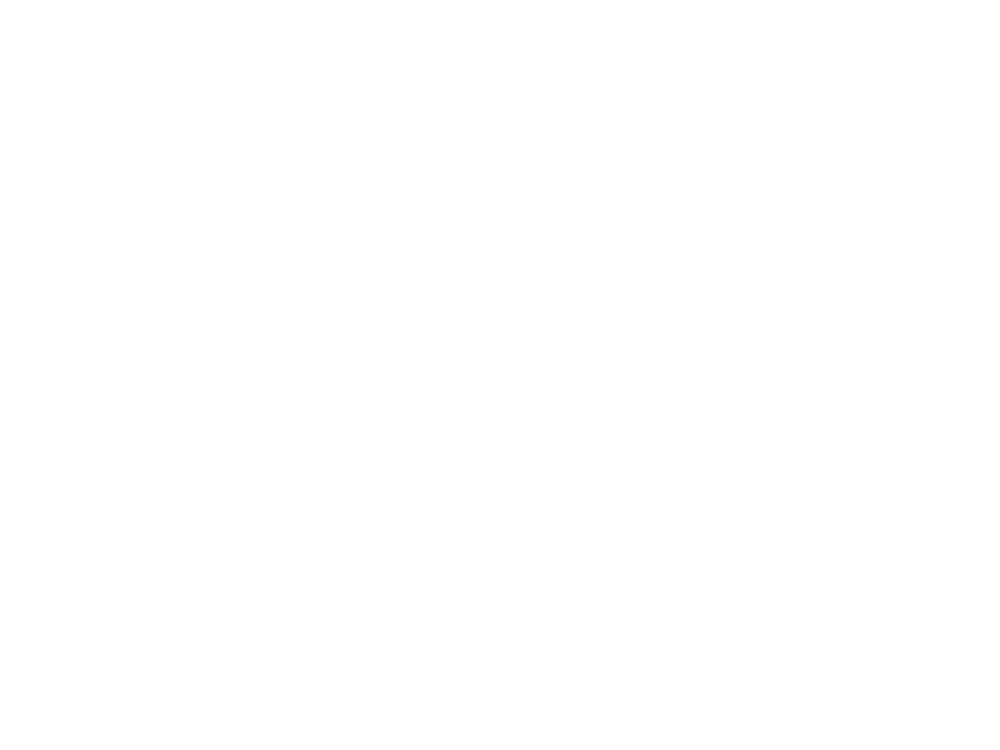

... [JC080|20190506|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC080-20190506-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC080/20190506/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_8a95b0_traces001_ba1965_traces001_f4a730_traces001_77eafa_traces001_78a718_traces001_e4c65e/data_arrays/np_subtracted.npz
NP_subtracted offset was: 93.07
adding NP offset... (NP baseline offset: 624.21)
((259

<IPython.core.display.Javascript object>


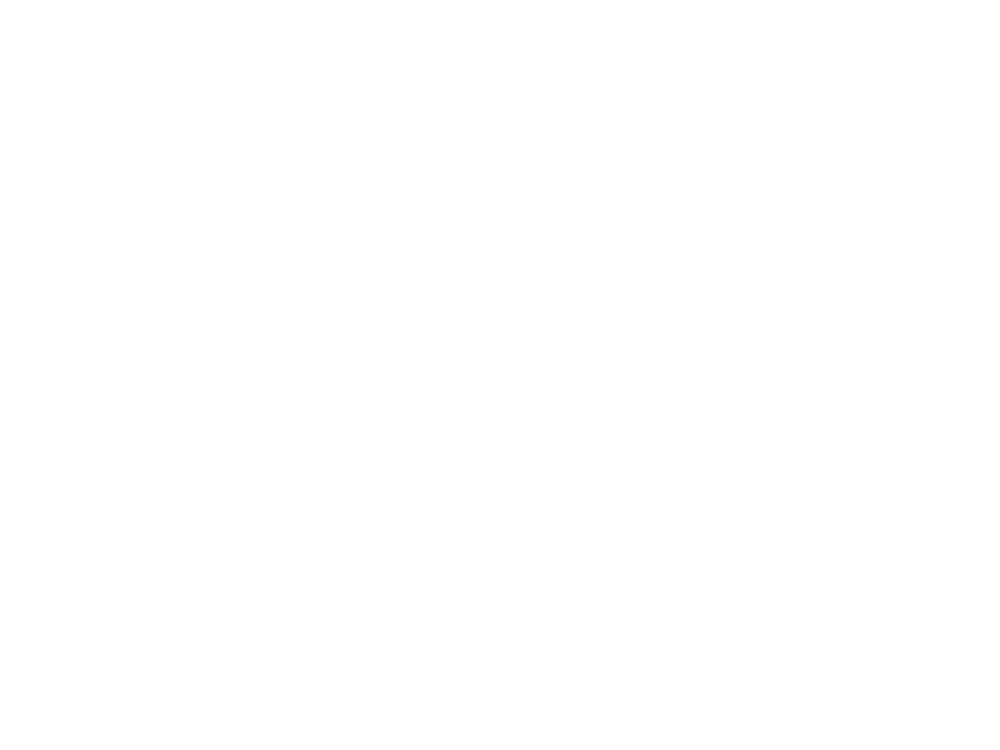

... [JC080|20190603|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC080-20190603-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC080/20190603/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_e17055_traces001_dd9e99_traces001_841aa9_traces001_d4242f_traces001_7b3713_traces001_d4ccf3/data_arrays/np_subtracted.npz
NP_subtracted offset was: 78.51
adding NP offset... (NP baseline offset: 773.60)
((201

<IPython.core.display.Javascript object>


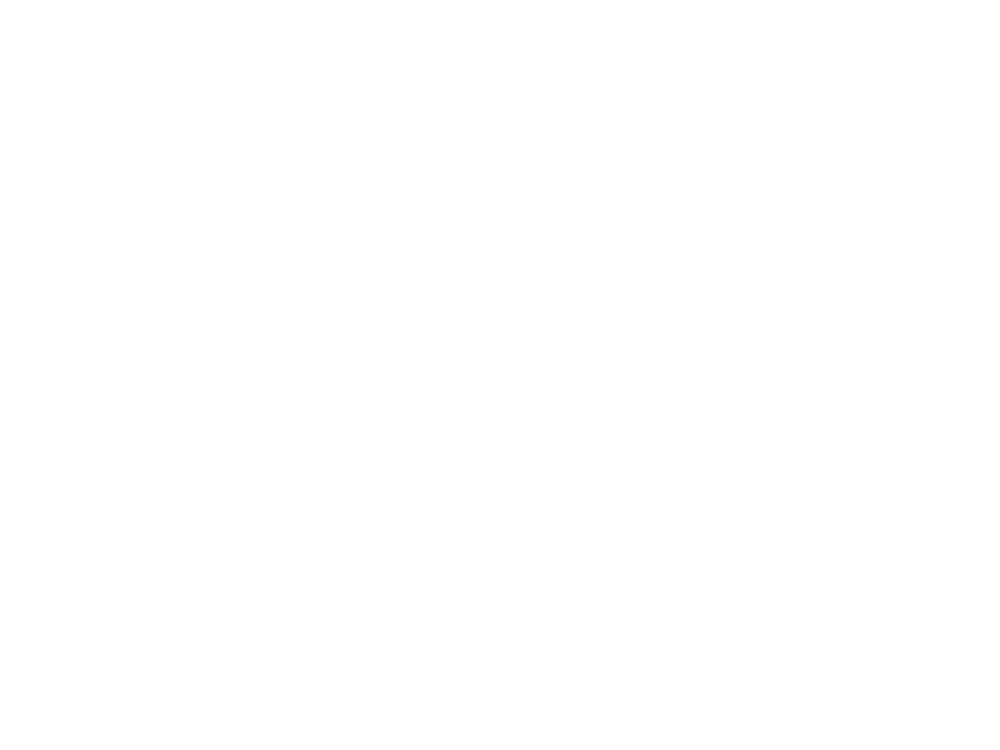

... [JC083|20190508|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC083-20190508-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC083/20190508/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_0f1e0a_traces001_1410d6_traces001_1023f7_traces001_9c6c51_traces001_3ea54b_traces001_249fdc/data_arrays/np_subtracted.npz
NP_subtracted offset was: 102.25
adding NP offset... (NP baseline offset: 590.61)
((26

<IPython.core.display.Javascript object>


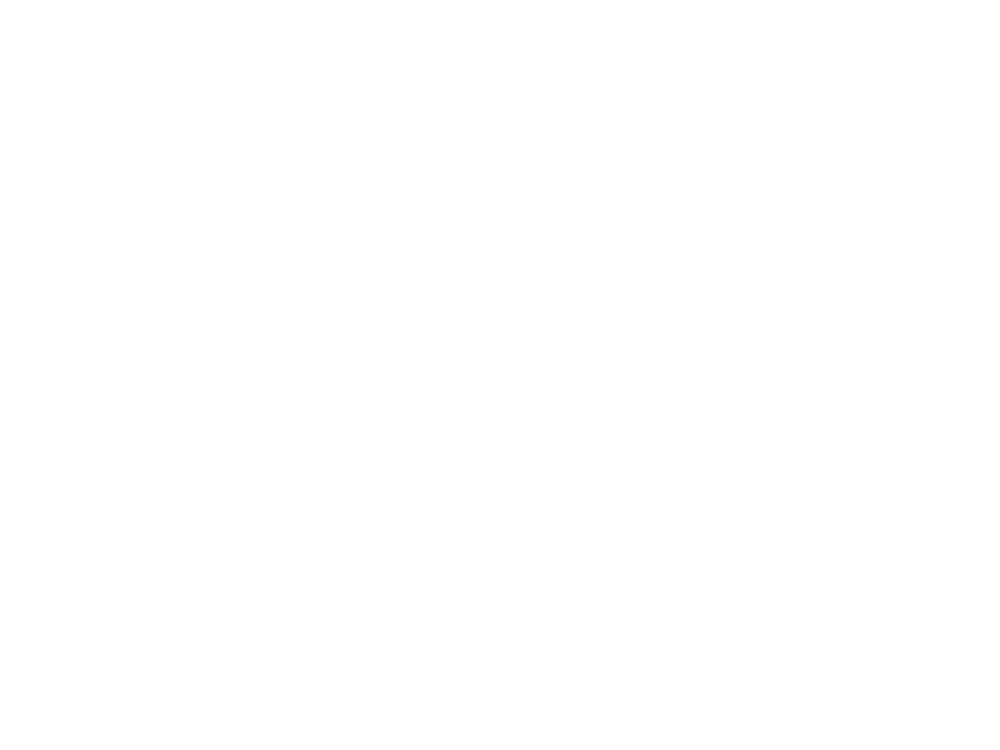

... [JC083|20190512|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC083-20190512-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC083/20190512/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_cb9ce5_traces001_fad0ce_traces001_cdd5f2_traces001_7e3617_traces001_e45519_traces001_4ad203_traces001_8117b2/data_arrays/np_subtracted.npz
NP_subtracted offset was: 84.43
adding NP offset... (NP baseline offs

<IPython.core.display.Javascript object>


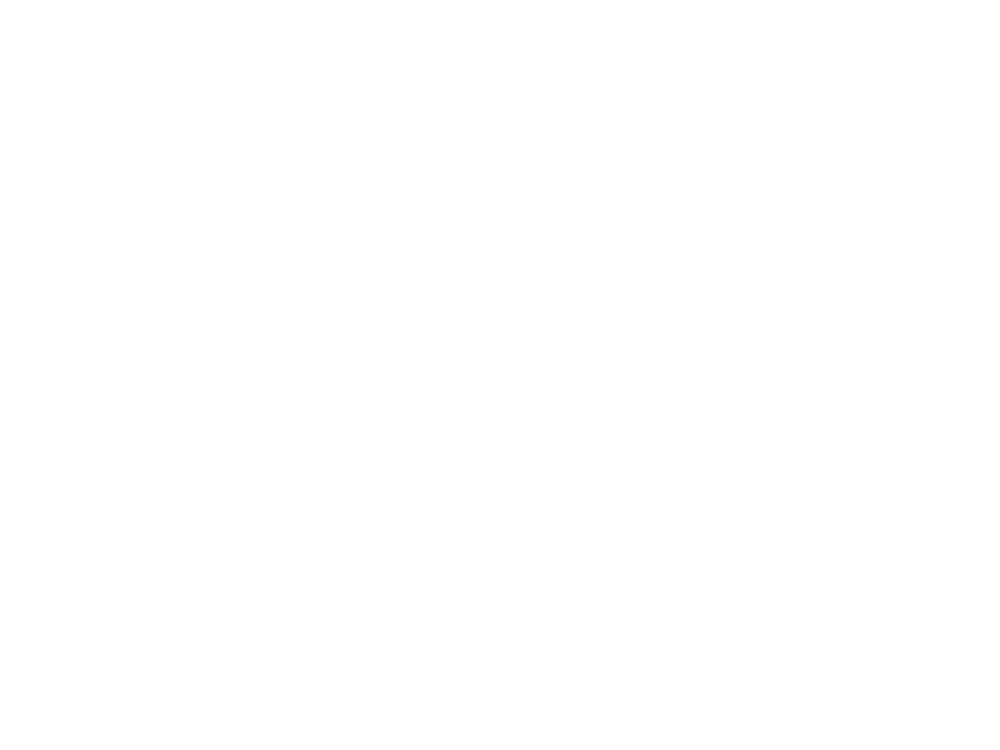

... [JC083|20190517|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC083-20190517-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC083/20190517/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_0c1b62_traces001_654830_traces001_c16392_traces001_266bc9_traces001_0b327f/data_arrays/np_subtracted.npz
NP_subtracted offset was: 124.16
adding NP offset... (NP baseline offset: 624.50)
((223750, 233), (233,

<IPython.core.display.Javascript object>


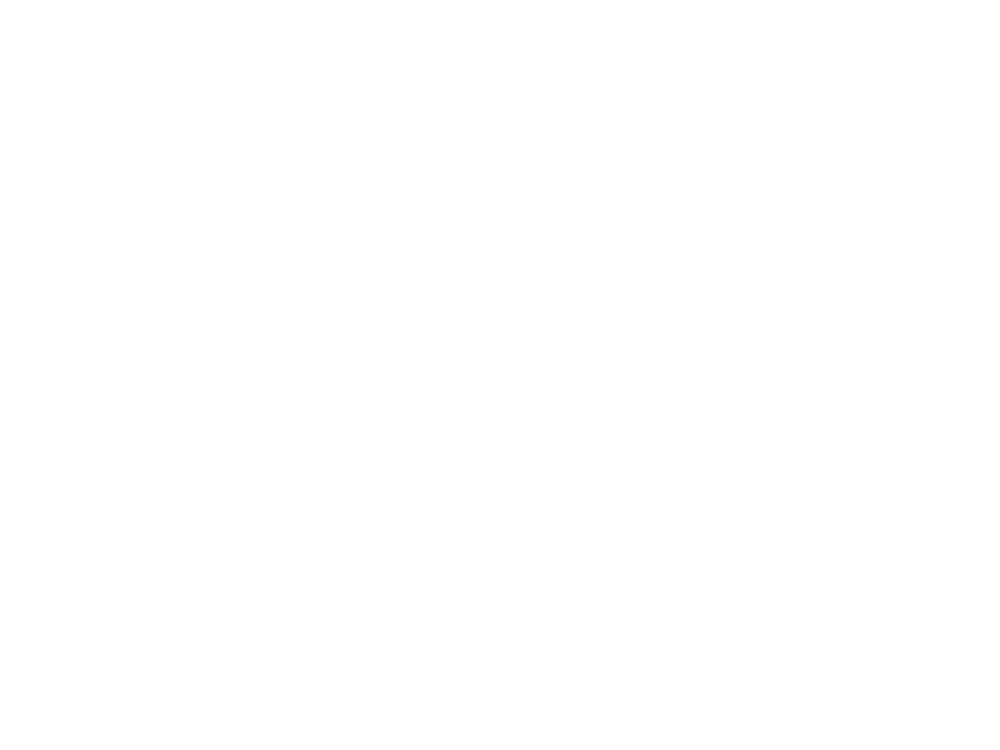

... [JC084|20190525|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC084-20190525-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC084/20190525/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_dea723_traces001_8cef6c_traces001_abf256_traces001_fb7bfa_traces001_452942_traces001_c0afbd/data_arrays/np_subtracted.npz
NP_subtracted offset was: 46.90
adding NP offset... (NP baseline offset: 329.73)
((268

<IPython.core.display.Javascript object>


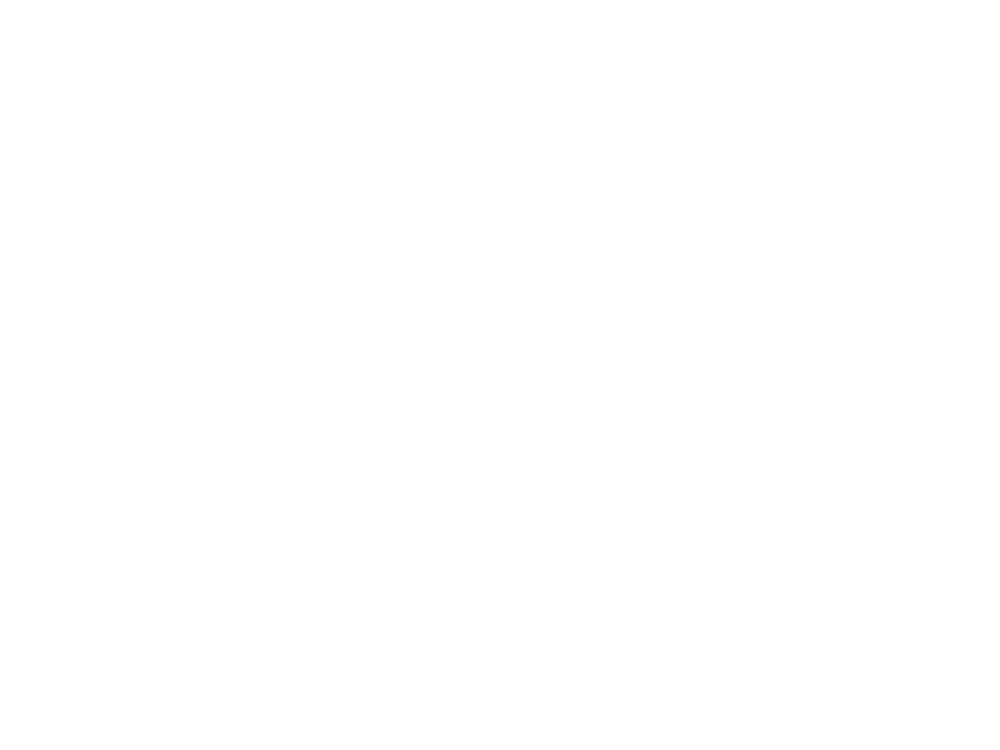

... [JC091|20190627|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Lm_JC091-20190627-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC091/20190627/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_99ce14_traces001_328664_traces001_f2e06a_traces001_26306f_traces001_7fd9a8_traces001_9f1071/data_arrays/np_subtracted.npz
NP_subtracted offset was: 70.01
adding NP offset... (NP baseline offset: 529.64)
((202

<IPython.core.display.Javascript object>


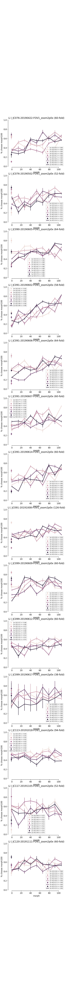

<IPython.core.display.Javascript object>


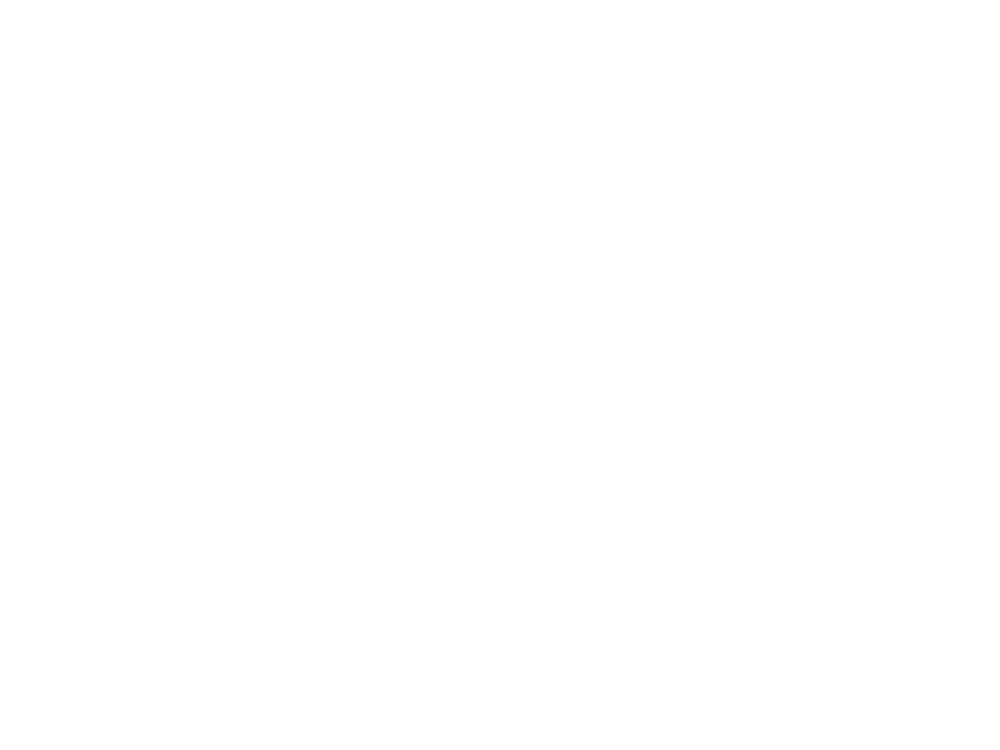

... [JC076|20190422|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC076-20190422-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC076/20190422/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_66b289_traces001_e95cc2_traces001_b96bf7_traces001_9cb69c_traces001_3485a6_traces001_7be2ae/data_arrays/np_subtracted.npz
NP_subtracted offset was: 179.98
adding NP offset... (NP baseline offset: 877.52)
((24

<IPython.core.display.Javascript object>


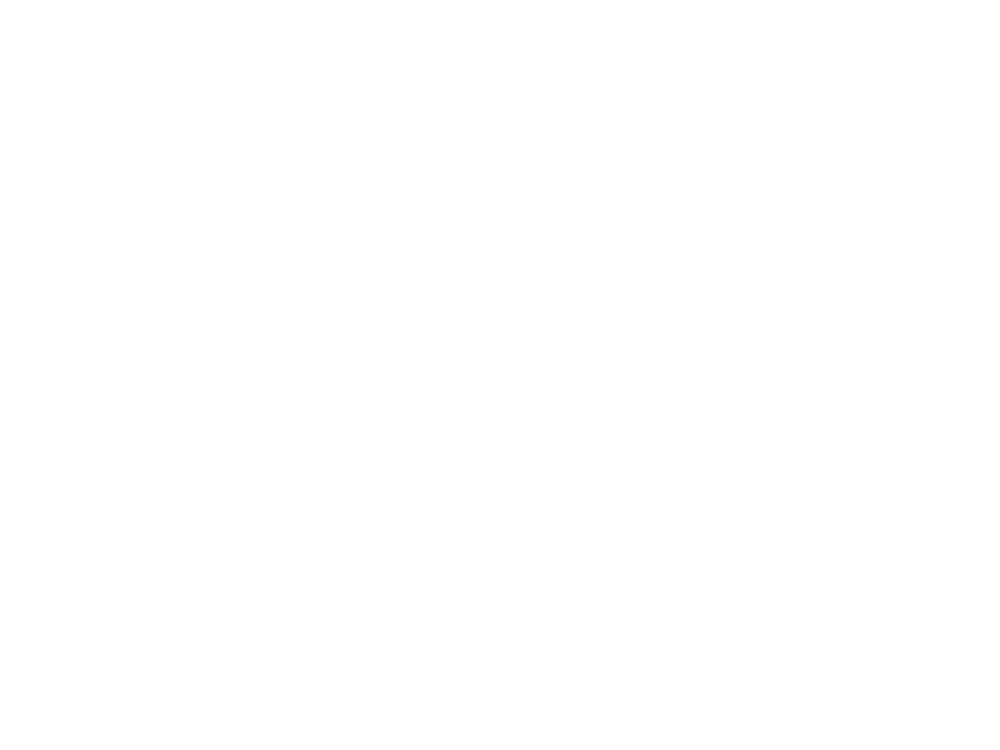

... [JC076|20190502|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC076-20190502-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC076/20190502/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_bc0893_traces001_05b262_traces001_cdf7b0_traces001_2649ff_traces001_e62928_traces001_82b664/data_arrays/np_subtracted.npz
NP_subtracted offset was: 187.56
adding NP offset... (NP baseline offset: 797.64)
((18

<IPython.core.display.Javascript object>


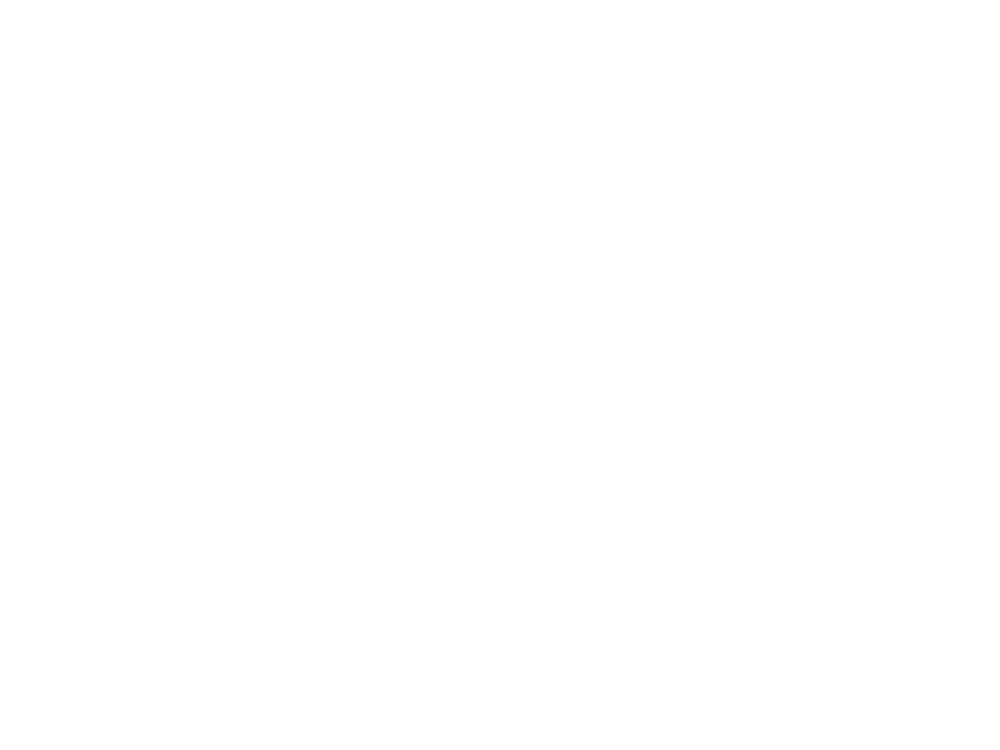

... [JC090|20190605|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC090-20190605-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC090/20190605/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_5afb30_traces001_ea6bc7_traces001_9747d8_traces001_70031f_traces001_ba4282_traces001_c2eec5_traces001_5c088e/data_arrays/np_subtracted.npz
NP_subtracted offset was: 12.62
adding NP offset... (NP baseline offs

<IPython.core.display.Javascript object>


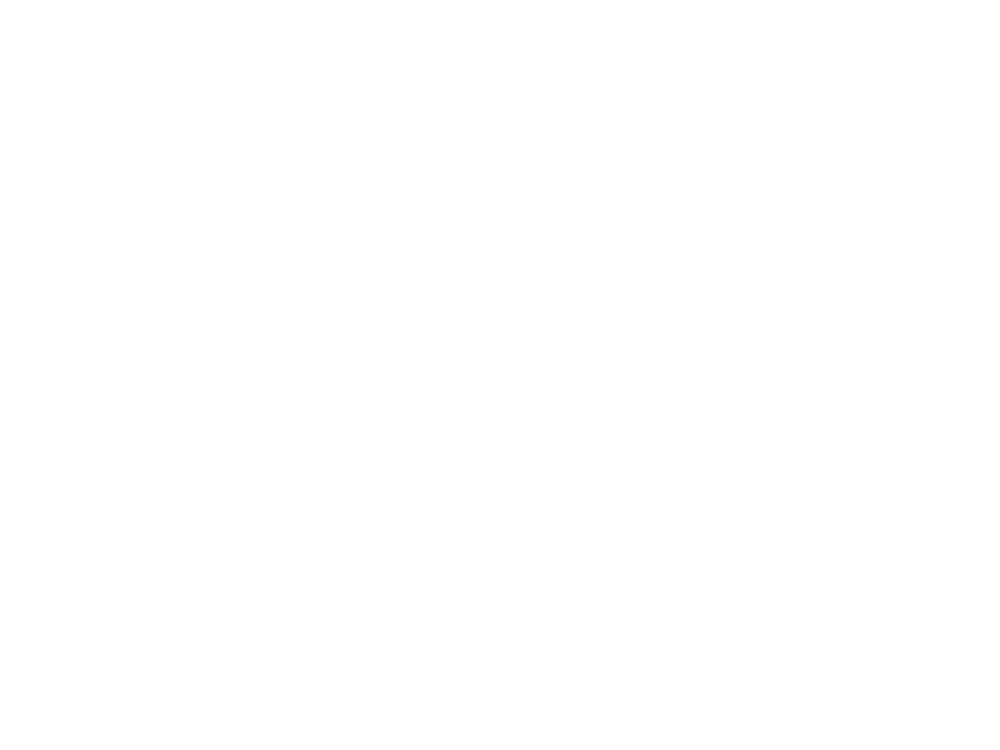

... [JC091|20190602|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC091-20190602-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC091/20190602/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_573669_traces001_3d2687_traces001_17838a_traces001_452178_traces001_c84a17_traces001_faae98/data_arrays/np_subtracted.npz
NP_subtracted offset was: 62.93
adding NP offset... (NP baseline offset: 372.49)
((202

<IPython.core.display.Javascript object>


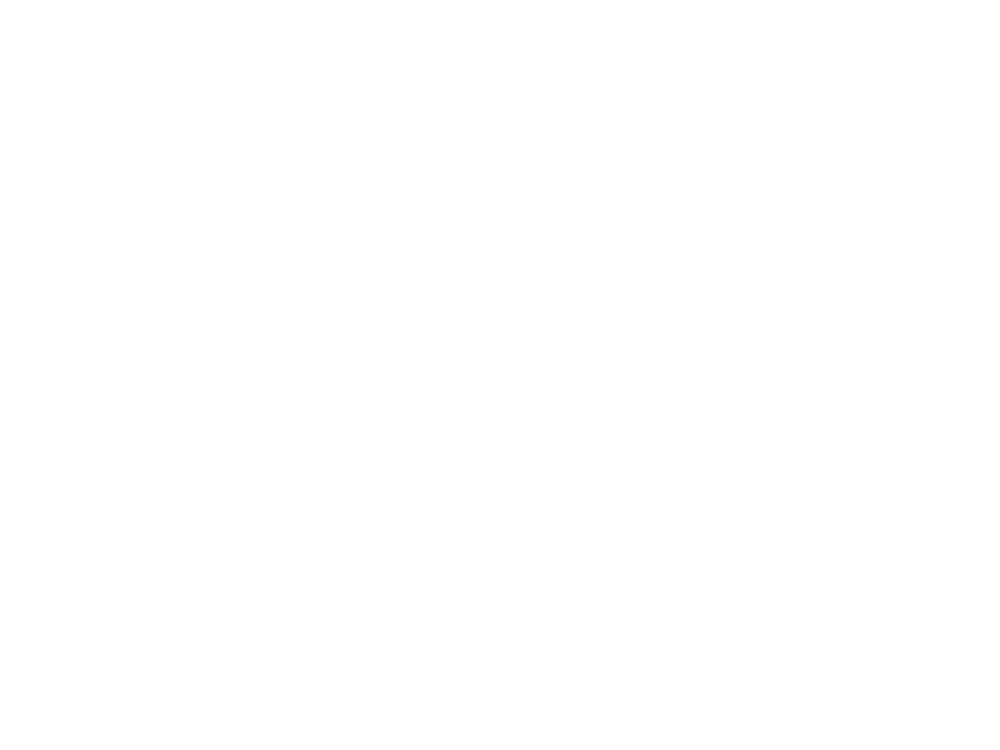

... [JC091|20190606|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC091-20190606-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC091/20190606/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_c8905e_traces001_cca83f_traces001_282089_traces001_d63f40_traces001_5e8ae8_traces001_d9484e_traces001_a6f53c/data_arrays/np_subtracted.npz
NP_subtracted offset was: 58.58
adding NP offset... (NP baseline offs

<IPython.core.display.Javascript object>


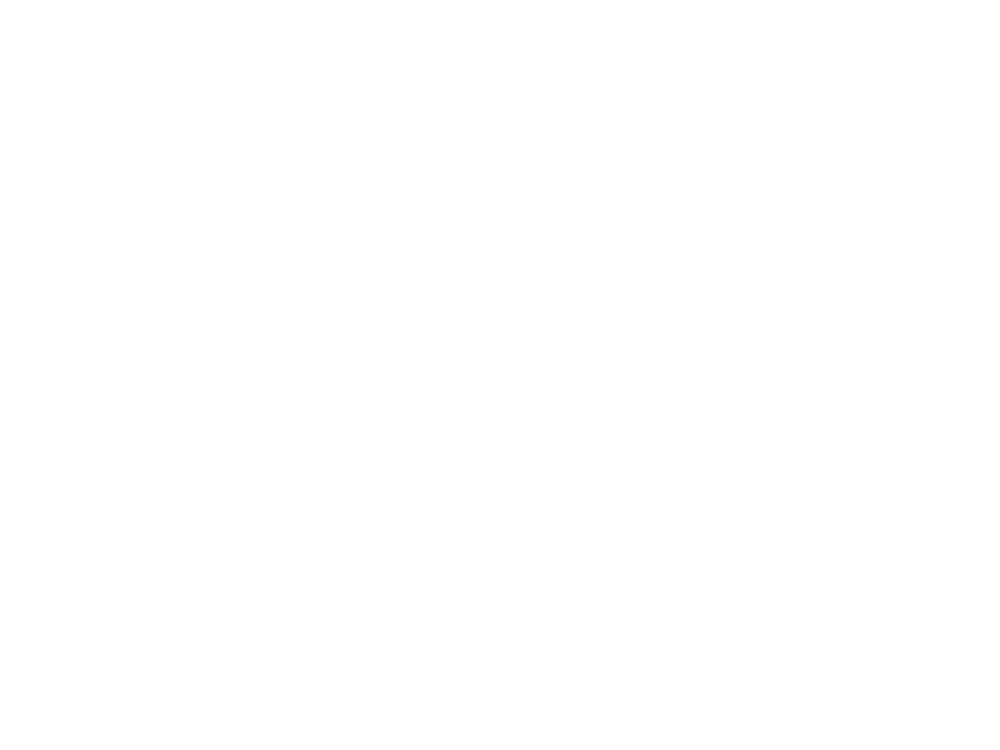

... [JC091|20190607|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC091-20190607-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC091/20190607/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_2afecb_traces001_8b62a3_traces001_fa925f_traces001_bcbaba_traces001_821fff_traces001_361c93/data_arrays/np_subtracted.npz
NP_subtracted offset was: 51.32
adding NP offset... (NP baseline offset: 427.80)
((202

<IPython.core.display.Javascript object>


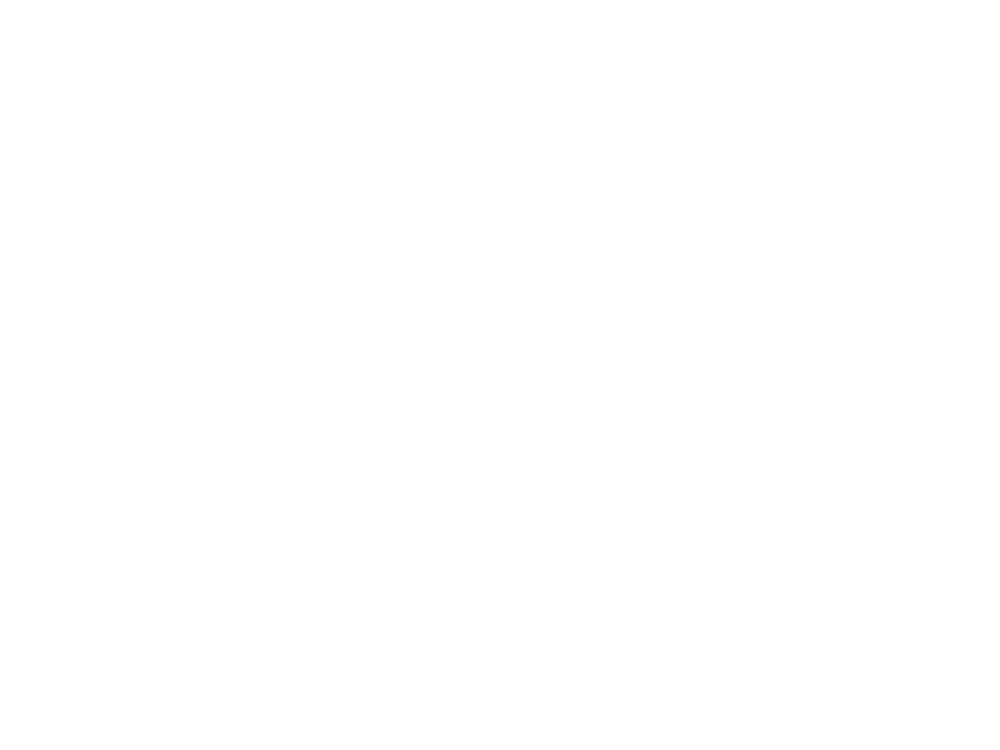

... [JC091|20190614|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC091-20190614-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC091/20190614/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_1109ae_traces001_920e9d_traces001_8dceeb_traces001_7c7a76_traces001_cc90dc_traces001_344475/data_arrays/np_subtracted.npz
NP_subtracted offset was: 15.63
adding NP offset... (NP baseline offset: 327.50)
((202

<IPython.core.display.Javascript object>


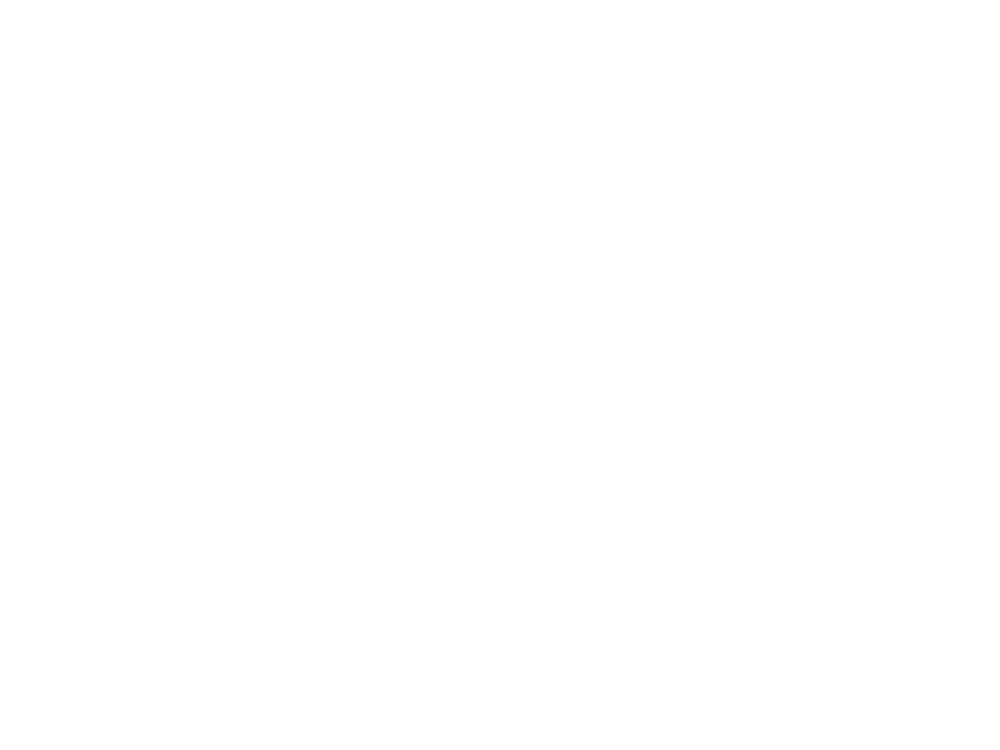

... [JC091|20191008|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC091-20191008-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC091/20191008/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_cc68de_traces001_2c5f0a_traces001_98b90b_traces001_7702d2_traces001_ca65ed_traces001_035050_traces001_2cd0d5_traces001_445323_traces001_e162ea_traces001_6372e2_traces001_e30953_traces001_96e3d7_traces001_a6c8

<IPython.core.display.Javascript object>


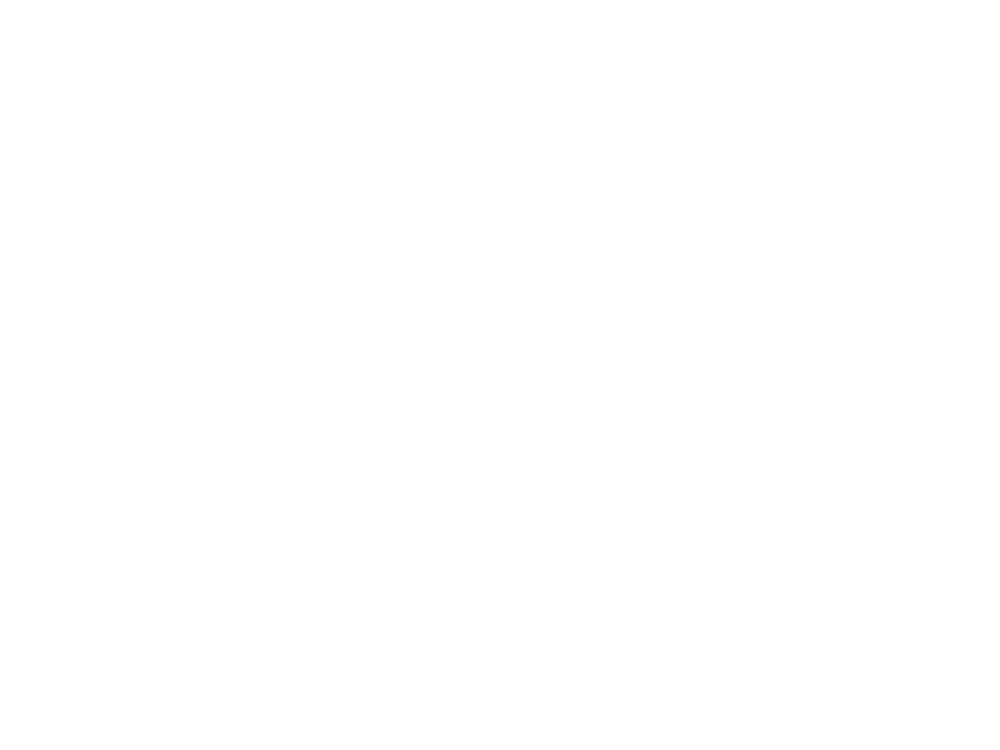

... [JC099|20190609|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC099-20190609-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC099/20190609/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_2be711_traces001_333f6c_traces001_31bd42_traces001_0b8503_traces001_2d8e76_traces001_8fe19c/data_arrays/np_subtracted.npz
NP_subtracted offset was: -8.23
adding NP offset... (NP baseline offset: 440.92)
((202

<IPython.core.display.Javascript object>


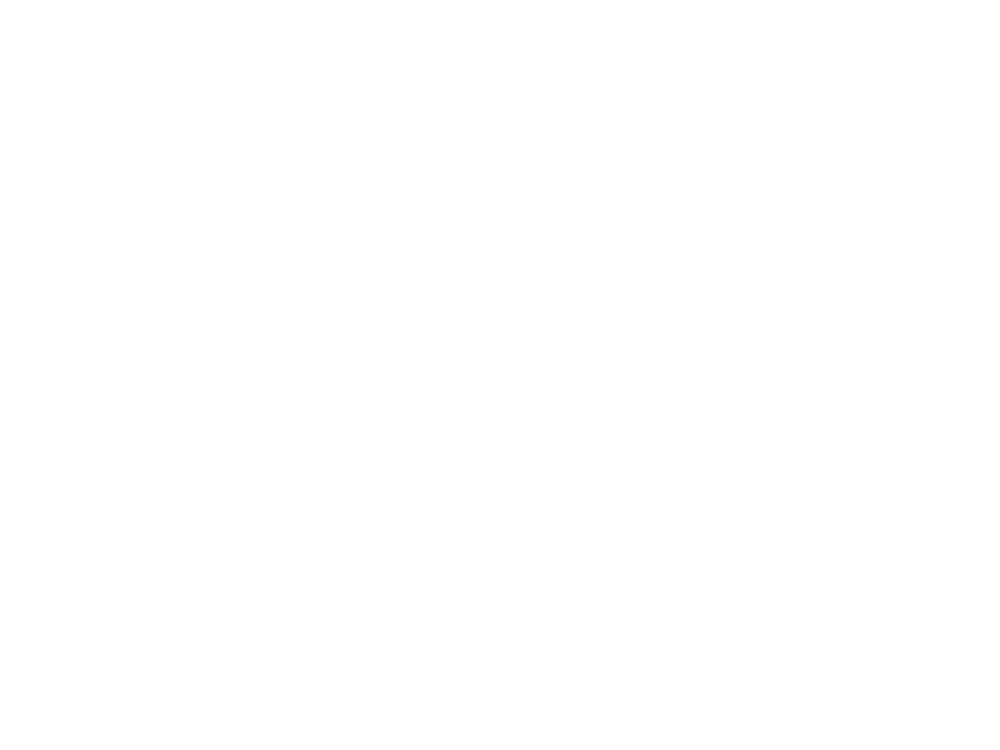

... [JC099|20190612|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC099-20190612-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC099/20190612/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_d86de1_traces001_8df9ce_traces001_61ca30_traces001_0266b8_traces001_111679_traces001_0abebe/data_arrays/np_subtracted.npz
NP_subtracted offset was: 40.01
adding NP offset... (NP baseline offset: 785.50)
((202

<IPython.core.display.Javascript object>


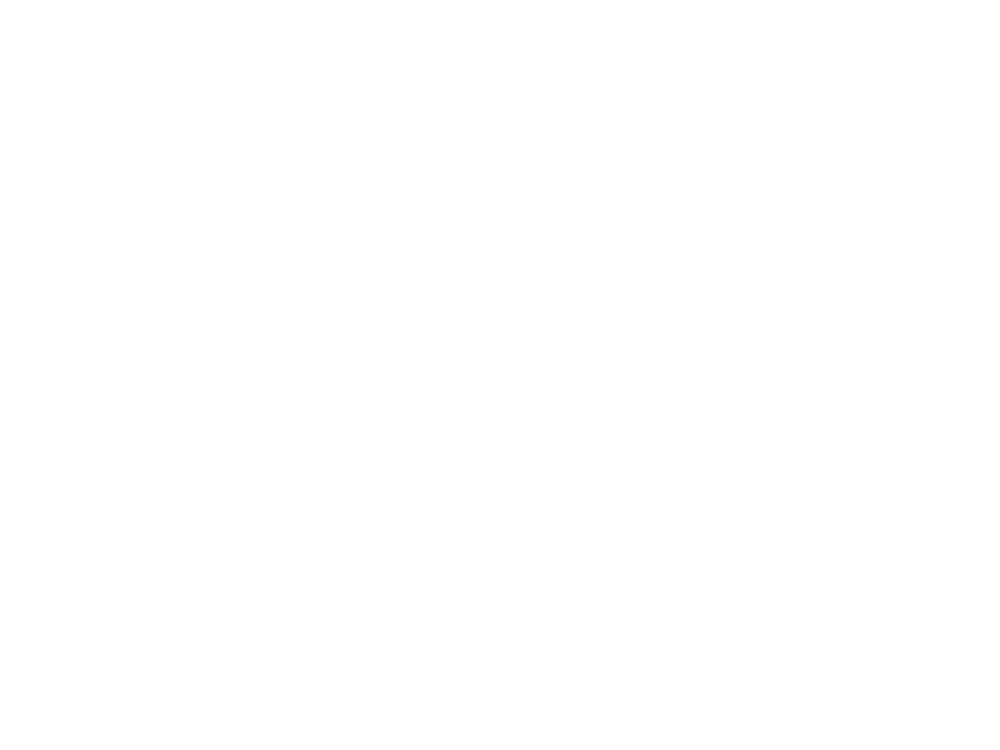

... [JC099|20190617|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC099-20190617-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC099/20190617/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_94cb73_traces001_9d8a71_traces001_7a514c_traces001_864da3/data_arrays/np_subtracted.npz
NP_subtracted offset was: 3.88
adding NP offset... (NP baseline offset: 854.19)
((131355, 102), (102,), ())
... adjustin

<IPython.core.display.Javascript object>


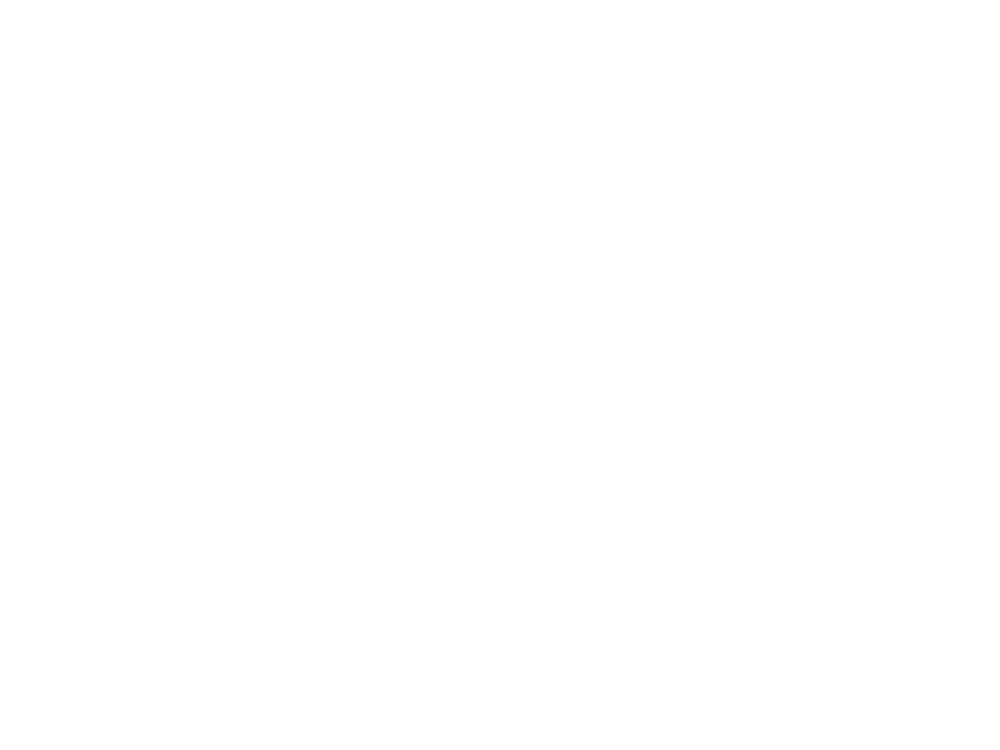

... [JC113|20191018|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC113-20191018-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC113/20191018/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_45d7bf_traces001_9d98af_traces001_e6dd0f_traces001_af8efe_traces001_53b0c3_traces001_48b222_traces001_5a33cb_traces001_636e28_traces001_9675ee_traces001_c992b1_traces001_deae7e/data_arrays/np_subtracted.npz
N

<IPython.core.display.Javascript object>


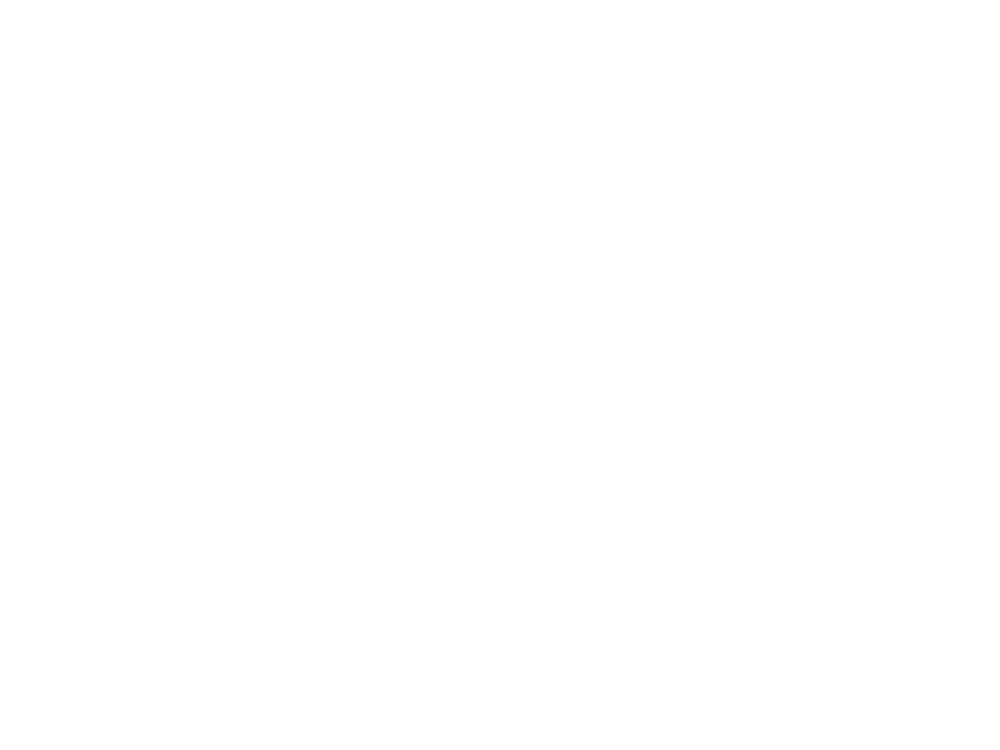

... [JC117|20191105|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC117-20191105-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC117/20191105/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_1621ed_traces001_99712e_traces001_498354_traces001_92ea72_traces001_e3ab25_traces001_a2c0dd/data_arrays/np_subtracted.npz
NP_subtracted offset was: 127.59
adding NP offset... (NP baseline offset: 1464.16)
((1

<IPython.core.display.Javascript object>


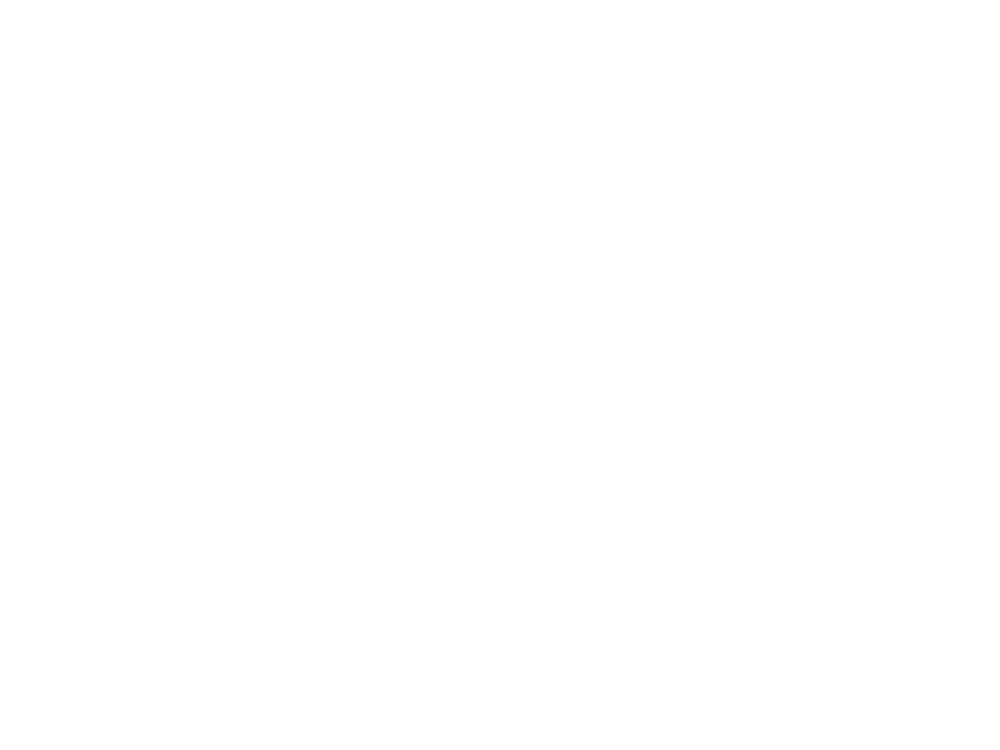

... [JC120|20191111|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
Getting stimulus info for: combined_blobs_static
          color morphlevel   object  size stimtype  xpos  ypos yrot
config001  0.08         -1  control  10.0    image  None  None    0
config002   0.2         -1  control  20.0    image  None  None    0
config003  0.32         -1  control  30.0    image  None  None    0
config004  0.44         -1  control  40.0    image  None  None    0
config005  0.56         -1  control  50.0    image  None  None    0
Timecourse: Li_JC120-20191111-FOV1_zoom2p0x_traces001-corrected.pkl
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC120/20191111/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_603e33_traces001_b209e8_traces001_0b0a19_traces001_67c45c_traces001_8513ce_traces001_12f240/data_arrays/np_subtracted.npz
NP_subtracted offset was: -32.03
adding NP offset... (NP baseline offset: 169.75)
((20

In [19]:
results = dict((visual_area, dict()) for visual_area in visual_areas)

for visual_area in visual_areas:
    
    sessions = dsets[ dsets['visual_area'] == visual_area ]
    n_datasets = sessions.shape[0]
    
    thresh_str = 'thr-%.2f' % min_dff if threshold_dff else 'no-thr'
    sfilename = os.path.join(aggr_stats_dir, '%s_%s_%s-%s.pkl' % (visual_area, experiment_type, response_type, thresh_str))
    print("Stats: %s" % os.path.split(sfilename)[-1])
    load_data=False
    try:
        with open(sfilename, 'rb') as f:
            allstats = pkl.load(f)
            #assert 'gdf' in estats
    except Exception as e:
        load_data = True
        allstats = {}
    print(allstats.keys())

    f2, axes = pl.subplots(n_datasets, figsize=(5, n_datasets*5))
    f2.patch.set_alpha(1)

    ai = 0
    #ai = 0
    for (animalid, session, fov), g in sessions.groupby(['animalid', 'session', 'fov']):
        ax2 = axes[ai]

        fig, ax = pl.subplots()
        fig.patch.set_alpha(1)

        skey = '-'.join([animalid, session, fov])
        data_id = '|'.join([animalid, session, fov, traceid, stats_desc])
        if animalid=='JC078' and session=='20190426':
            continue
        exp = util.Objects(animalid, session, fov, traceid=traceid, rootdir=rootdir)    
        # Get stimulus conditions
        sdf = exp.get_stimuli()
        sdf = reformat_morph_values(sdf)
        print sdf.head()
        tested_sizes = np.array(sorted(sdf['size'].unique()))
        tested_morphs = np.array(sorted(sdf['morphlevel'].unique()))

        sdf = reformat_morph_values(sdf)        
        n_sizes = len(tested_sizes)
        n_morphs = len(tested_morphs)
        if n_sizes != n_sz or n_morphs != n_mp:
            incorrect_nvalues.append(skey)
            pass

        trace_desc = '%s_%s-%s' % (skey, traceid, trace_type)
        tfilename = os.path.join(aggr_tcourse_dir, '%s_%s.pkl' % (visual_area, trace_desc))
        print("Timecourse: %s" % os.path.split(tfilename)[-1])
        #
        load_data=True
#         try:
#             with open(tfilename, 'rb') as f:
#                 exp = pkl.load(f)
#                 assert exp.data is not None and 'traces' in dir(exp.data)
#                 sdf = exp.data.sdf.copy()
#         except Exception as e:
#             load_data = True

        sdf = reformat_morph_values(sdf)

        if load_data:
            # Get metrics for each condition
            estats = exp.get_stats(responsive_test=responsive_test, responsive_thr=responsive_thr, n_stds=n_stds)
            with open(tfilename, 'wb') as f:
                pkl.dump(exp, f, protocol=pkl.HIGHEST_PROTOCOL)
            allstats[skey] = estats

        meanr = pd.concat([pd.Series(estats.gdf.get_group(roi).groupby(['config']).mean()['dff'], name=roi) \
                           for roi in estats.rois], axis=1).T

        # Get ROI list
        if threshold_dff:
            rois_plot = meanr[(meanr.max(axis=1) > min_dff)].index.tolist()
        else:
            rois_plot = meanr.index.tolist()
        print("Plotting %i of %i responsive cells." % (len(rois_plot), len(meanr.index.tolist())))

        sample_data = pd.concat([pd.DataFrame(roidf[response_type].values, columns=[roi],
                                              index=roidf['config']) for roi, roidf in estats.gdf], axis=1)
        sample_data = sample_data[rois_plot]
        sample_labels = np.array(sample_data.index.tolist())


        #stimdf = sdf[sdf['morphlevel'] != -1]
        stimdf = sdf.copy()
        
        #% Specify train/test conditions:     
        class_name = 'morphlevel'
        class_types = [0, 106]
        restrict_transform = True
        constant_transform = 'size'

        C = 1e3
        m0 = 0
        m100 = 106
        #fig, ax = pl.subplots()

        size_colors = sns.cubehelix_palette(len(tested_sizes))
        lw=2
        pdict = dict()
        for curr_sz, curr_color in zip(tested_sizes, size_colors):

            if restrict_transform:
                constant_transform_val = curr_sz
                train_configs = stimdf[((stimdf[class_name].isin(class_types)) & (stimdf[constant_transform]==constant_transform_val))].index.tolist()
            else:
                train_configs = stimdf[stimdf[class_name].isin(class_types)].index.tolist()

            # Set train/test set:
            train_ixs = [i for i, l in enumerate(sample_labels) if l in train_configs]

            X = sample_data.iloc[train_ixs].values #[train_configs]
            y = np.array([stimdf[class_name][c] for c in sample_labels[train_ixs]])

            # Set validation set:
            untrained_class_types = [c for c in stimdf[class_name].unique() if c not in class_types]
            test_configs = stimdf[( (stimdf[constant_transform]==constant_transform_val) & (stimdf[class_name].isin(untrained_class_types)) )].index.tolist()
            test_ixs = [i for i, l in enumerate(sample_labels) if l in test_configs]
            X_test = sample_data.iloc[test_ixs].values
            y_test_labels = sample_labels[test_ixs]


            #% Train/test split
            n_splits = len(X)

            kf = KFold(n_splits=n_splits)
            kf.get_n_splits(X)

            scores=[]
            test_scores = dict((stimdf[class_name][tc], []) for tc in test_configs)
            choices = dict((tc, []) for tc in tested_morphs)

            for train_index, validate_index in kf.split(X):
                # Get current train/test split data:
                X_train, X_validate = X[train_index], X[validate_index]
                y_train, y_validate = y[train_index], y[validate_index]
                scaler = preprocessing.StandardScaler().fit(X_train)
                X_train_transformed = scaler.transform(X_train)

                # Fit SVM:
                trained_svc = LinearSVC(multi_class='ovr', C=C).fit(X_train_transformed, y_train)

                # Test:
                X_validate_transformed = scaler.transform(X_validate)
                curr_score = trained_svc.score(X_validate_transformed, y_validate)  
                y_pred = trained_svc.predict(X_validate_transformed)

                # Test 2:
                for true_val, pred_val in zip(y_validate, y_pred):
                    choices[true_val].append(pred_val)

                for tc in test_configs:
                    X_test_transformed = scaler.transform(X_test[np.where(y_test_labels==tc)[0], :])
                    curr_score_test = trained_svc.score(X_test_transformed, [m100 for _ in range(X_test_transformed.shape[0])])  
                    test_scores[stimdf[class_name][tc]].append(curr_score_test)
                    y_pred_test = trained_svc.predict(X_test_transformed)

                    choices[stimdf[class_name][tc]].append(y_pred_test)

                scores.append(curr_score)

            print("mean score: %.2f (+/- %.2f)" % (np.mean(scores), spstats.sem(scores)))
            #for k, v in sorted(test_scores.items(), key=lambda x: x[0]):
            #    print k, np.nanmean(v)

            #fig, ax = pl.subplots()
            pchoose100={}
            pchoose100_sem={}
            for k, v in choices.items():
                if k in [m0, m100]:
                    pchoose100[k] = np.mean(np.sum([i==m100 for i in v]) / float(len(v)))
                    pchoose100_sem[k] = np.std([i==m100 for i in v]) / float(len(v))
                else:
                    pchoose100[k] = np.mean([np.sum([i==m100 for i in vv]) / float(len(vv)) for vv in v])
                    pchoose100_sem[k] = np.std([np.sum([i==m100 for i in vv]) / float(len(vv)) for vv in v])

            curr_label = "[sz %i] %.2f (+/- %.2f)" % (curr_sz, np.mean(scores), spstats.sem(scores))
            for cax in [ax, ax2]:
                if -1 in pchoose100.keys():
                    cax.plot(sorted(pchoose100.keys())[0], [pchoose100[k] for k in sorted(pchoose100.keys())][0], 'o', \
                        markersize=5, lw=lw, color=curr_color, label=curr_label)
                    cax.errorbar(sorted(pchoose100.keys())[0], [pchoose100[k] for k in sorted(pchoose100.keys())][0],\
                            yerr=[pchoose100_sem[k] for k in sorted(pchoose100_sem.keys())][0], fmt='none',
                            ecolor=curr_color)

                    cax.plot(sorted(pchoose100.keys())[1:], [pchoose100[k] for k in sorted(pchoose100.keys())][1:], '-', \
                            markersize=.5, lw=lw, color=curr_color, label=curr_label)
                    cax.errorbar(sorted(pchoose100.keys())[1:], [pchoose100[k] for k in sorted(pchoose100.keys())][1:],\
                                yerr=[pchoose100_sem[k] for k in sorted(pchoose100_sem.keys())][1:], fmt='none',
                                ecolor=curr_color)
                else:
                    cax.plot(sorted(pchoose100.keys()), [pchoose100[k] for k in sorted(pchoose100.keys())], '-', \
                            markersize=.5, lw=lw, color=curr_color, label=curr_label)
                    cax.errorbar(sorted(pchoose100.keys()), [pchoose100[k] for k in sorted(pchoose100.keys())],\
                                yerr=[pchoose100_sem[k] for k in sorted(pchoose100_sem.keys())], fmt='none',
                                ecolor=curr_color)
                
                cax.set_ylim([0, 1])
                cax.set_ylabel('% choose morph100')
                cax.set_xlabel('morph')
                cax.set_title('%s | %s (%i-fold)' % (visual_area, skey, n_splits))
                sns.despine(trim=True, offset=4, ax=cax)
            pdict['size_%i' % curr_sz] = {'mean': pchoose100, 'sem': pchoose100_sem}
            
        ax.legend(fontsize=6)
        ax2.legend(fontsize=6)

        pl.figure(fig.number)
        figname = '%s_%s_AvsB-linearSVM-LOO' % (visual_area, skey)
        pl.savefig(os.path.join(outdir, 'sessions', '%s.png' % figname))
        pl.close()
        ai += 1
        print figname
        
        results[visual_area][skey] = pdict
        
    pl.figure(f2.number)
    figname = '%s_AvsB-linearSVM-LOO_all-datasets' % (visual_area)
    pl.savefig(os.path.join(outdir, '%s.svg' % figname))

    with open(sfilename, 'wb') as f:
        pkl.dump(allstats, f, protocol=pkl.HIGHEST_PROTOCOL)


In [20]:
print outdir

/n/coxfs01/julianarhee/aggregate-visual-areas/blob-classification/stats-traces001-corrected-dff-ROC-thr-0.05


In [21]:
#### Save
with open(os.path.join(outdir, 'results-by-area_AvsB-linearSVM-LOO.pkl'), 'wb') as f:
    pkl.dump(results, f, protocol=pkl.HIGHEST_PROTOCOL)


In [14]:
with open(os.path.join(outdir, 'results-by-area_AvsB-linearSVM-LOO.pkl'), 'rb') as f:
    results = pkl.load(f)

IOError: [Errno 2] No such file or directory: '/n/coxfs01/julianarhee/aggregate-visual-areas/blob-classification/stats-traces001-corrected-dff-ROC-thr-0.05/results-by-area_AvsB-linearSVM-LOO.pkl'

In [13]:

# To load nstds-thr-10.00:
outdir = '/n/coxfs01/julianarhee/aggregate-visual-areas/blob-classification/stats-traces001-corrected-dff-ROC-thr-0.05'
with open(os.path.join(outdir, 'results-by-area_AvsB-linearSVM-LOO.pkl'), 'rb') as f:
    results = pkl.load(f)

'/n/coxfs01/julianarhee/aggregate-visual-areas/blob-classification/stats-traces001-corrected-dff-ROC-thr-0.05'

In [22]:

dlist = []

for visual_area in visual_areas:
    for skey, pres in results[visual_area].items():
        for sz, res in pres.items():
            szval = int(sz.split('_')[-1])
            nmorphs = len(res['mean'].keys())
            animalid = skey.split('-')[0]
            session = skey.split('-')[1]
            fov = skey.split('-')[2]
            d= pd.DataFrame({'mean': [res['mean'][m] for m in sorted(res['mean'].keys())],
                         'sem': [res['sem'][m] for m in sorted(res['mean'].keys())],
                         'morph': sorted(res['mean'].keys()),
                         'size': [szval for _ in range(nmorphs)],
                          'animalid': [animalid for _ in range(nmorphs)],
                          'session': [session for _ in range(nmorphs)],
                          'fov': [fov for _ in range(nmorphs)],
                          'visual_area': [visual_area for _ in range(nmorphs)]})
            dlist.append(d)


In [23]:
probs = pd.concat(dlist, axis=0)


In [ ]:
#### plotting

In [ ]:
#with open(os.path.join(outdir, 'results-pChoose100_%s.pkl' % datestr), 'rb') as f:
#    probs = pkl.load(f)

In [24]:
probs.head()

,animalid,fov,mean,morph,sem,session,size,visual_area
0,JC076,FOV1_zoom2p0x,0.189444,-1,0.037757,20190501,50,V1
1,JC076,FOV1_zoom2p0x,0.266667,0,0.014741,20190501,50,V1
2,JC076,FOV1_zoom2p0x,0.368333,14,0.020571,20190501,50,V1
3,JC076,FOV1_zoom2p0x,0.412222,27,0.040810,20190501,50,V1
4,JC076,FOV1_zoom2p0x,0.571111,40,0.018725,20190501,50,V1


In [25]:
pchoose_grp = dict((visual_area, []) for visual_area in visual_areas)
for k, g in probs.groupby(['visual_area', 'animalid', 'session', 'fov']):
    if k[1]=='JC078' and k[2]=='20190426':
        continue
    print(k)
    arr = np.array([gg['mean'].values for sz, gg in g.groupby(['size'])])
    pchoose_grp[k[0]].append(arr)


('Li', 'JC076', '20190422', 'FOV1_zoom2p0x')
('Li', 'JC076', '20190502', 'FOV1_zoom2p0x')
('Li', 'JC090', '20190605', 'FOV1_zoom2p0x')
('Li', 'JC091', '20190602', 'FOV1_zoom2p0x')
('Li', 'JC091', '20190606', 'FOV1_zoom2p0x')
('Li', 'JC091', '20190607', 'FOV1_zoom2p0x')
('Li', 'JC091', '20190614', 'FOV1_zoom2p0x')
('Li', 'JC091', '20191008', 'FOV1_zoom2p0x')
('Li', 'JC099', '20190609', 'FOV1_zoom2p0x')
('Li', 'JC099', '20190612', 'FOV1_zoom2p0x')
('Li', 'JC099', '20190617', 'FOV1_zoom2p0x')
('Li', 'JC113', '20191018', 'FOV1_zoom2p0x')
('Li', 'JC117', '20191105', 'FOV1_zoom2p0x')
('Li', 'JC120', '20191111', 'FOV1_zoom2p0x')
('Lm', 'JC078', '20190430', 'FOV1_zoom2p0x')
('Lm', 'JC078', '20190504', 'FOV1_zoom2p0x')
('Lm', 'JC078', '20190509', 'FOV1_zoom2p0x')
('Lm', 'JC078', '20190513', 'FOV1_zoom2p0x')
('Lm', 'JC080', '20190506', 'FOV1_zoom2p0x')
('Lm', 'JC080', '20190603', 'FOV1_zoom2p0x')
('Lm', 'JC083', '20190508', 'FOV1_zoom2p0x')
('Lm', 'JC083', '20190512', 'FOV1_zoom2p0x')
('Lm', 'JC

In [26]:
for visual_area, arr in pchoose_grp.items():
    pchoose_grp[visual_area] = np.dstack(arr)


In [27]:
tested_sizes = sorted(sdf['size'].unique())
tested_morphs = sorted(sdf['morphlevel'].unique())


In [28]:
[pchoose_grp[visual_area].shape for visual_area in visual_areas]

[(5, 10, 11), (5, 10, 11), (5, 10, 14)]

In [29]:
[pchoose_grp[visual_area].shape for visual_area in visual_areas]

[(5, 10, 11), (5, 10, 11), (5, 10, 14)]

In [30]:
size_colors = sns.color_palette("Greys", len(tested_sizes))


In [32]:
datestr = '2020' #1211'

<IPython.core.display.Javascript object>


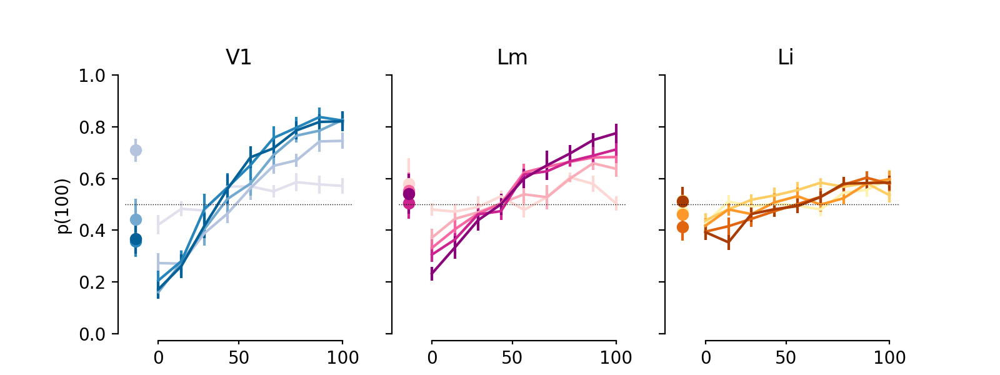

In [36]:
fig, axes = pl.subplots(1, 3, sharex=True, sharey=True, figsize=(8,3))
for ax, visual_area in zip(axes, visual_areas):
    arr = np.mean(pchoose_grp[visual_area], axis=-1)
    arr_sem = spstats.sem(pchoose_grp[visual_area], axis=-1)

    if visual_area=='V1':
        #size_colors = sns.color_palette("Greys", len(tested_sizes))
        size_colors = sns.color_palette("PuBu", len(tested_sizes))
    elif visual_area == 'Lm':
        #size_colors = sns.color_palette("Blues", len(tested_sizes))
        size_colors = sns.color_palette("RdPu", len(tested_sizes))
    else:
        #size_colors = sns.color_palette("Oranges", len(tested_sizes))
        size_colors = sns.color_palette("YlOrBr", len(tested_sizes))

    for si, sz in enumerate(tested_sizes):
        curr_color = size_colors[si]
        # plot control
        ax.plot(0, arr[si, 0], color=curr_color, marker='o')
        ax.errorbar(0, arr[si, 0],\
                        yerr=arr_sem[si, 0], fmt='none',
                        ecolor=curr_color)

        ax.plot(np.arange(1, len(tested_morphs)), arr[si, 1:], color=curr_color)
        ax.errorbar(np.arange(1, len(tested_morphs)), arr[si, 1:],\
                        yerr=arr_sem[si, 1:], fmt='none',
                        ecolor=curr_color)
    
    ax.set_ylim([0, 1])
    ax.set_title(visual_area)
    

for ai, ax in enumerate(axes):
    midp = (len(tested_morphs)-1)/2.
    ax.set_xticks([1, midp, len(tested_morphs)-1]) #range(len(tested_morphs)))
    ax.set_xticklabels([0, 50, 100])
    sns.despine(trim=True, offset=4)
    ax.axhline(y=0.5, linestyle=':', color='k', lw=0.5)
    ax.tick_params(which='both', axis='x', length=2)
    if ai==0:
        ax.set_ylabel('p(100)')
        
pl.subplots_adjust(top=0.8)

pl.savefig(os.path.join(outdir, 'avg-pChoose100-LOO_by-visual-area-colors_%s_bmo.svg' % datestr))
pl.savefig(os.path.join(outdir, 'avg-pChoose100-LOO_by-visual-area-colors_%s_bmo.png' % datestr))

In [37]:
outdir

'/n/coxfs01/julianarhee/aggregate-visual-areas/blob-classification/stats-traces001-corrected-dff-ROC-thr-0.05'

In [29]:
choice_vals=dict((sz, []) for sz, gg in g.groupby(['size']))
for sz, gg in g.groupby(['size']):
    choice_vals[sz].append(gg['mean'].values)
    


In [30]:
choice_vals

{10: [array([0.68319559, 0.45454545, 0.36960514, 0.3241506 , 0.32644628,
         0.52341598, 0.57713499, 0.52020202, 0.30945822, 0.54545455])],
 20: [array([0.83654729, 0.3030303 , 0.18089991, 0.32185491, 0.38429752,
         0.46418733, 0.65013774, 0.81450872, 0.86960514, 0.78787879])],
 30: [array([0.19834711, 0.27272727, 0.12626263, 0.42607897, 0.38980716,
         0.48438935, 0.60514233, 0.684573  , 0.58539945, 0.81818182])],
 40: [array([0.48484848, 0.27272727, 0.39853076, 0.46143251, 0.67401286,
         0.69651056, 0.76997245, 0.80578512, 0.7943067 , 0.75757576])],
 50: [array([0.49265381, 0.21212121, 0.24104683, 0.4912764 , 0.55004591,
         0.82277319, 0.75482094, 0.66069789, 0.78833792, 0.84848485])]}

In [31]:
np.array([gg['mean'].values for sz, gg in g.groupby(['size'])]).shape

(5, 10)

In [32]:
with open(os.path.join(outdir, 'results-pChoose100_%s.pkl' % datestr), 'wb') as f:
    pkl.dump(probs, f, protocol=pkl.HIGHEST_PROTOCOL)